In [1]:
import pandas as pd
import time

In [2]:
start=time.perf_counter()

In [3]:
from DatabaseCreator import DatabaseCreator
import CJDH_local_settings

#Run Database Creator
if __name__ == "__main__":
    db_creator = DatabaseCreator(db_settings=CJDH_local_settings.local_settings['FPL_Points_Predictor'])
    fpl_engine = db_creator.get_engine_for("fpl_data_analysis")

In [ ]:
from FPLPredictor import FPLPredictor

In [ ]:
#add this info to a settings dict?
stats_current_gameweek = 12
picks_current_gameweek = 12
current_season = 20252026

In [ ]:
# Load df from sql
df = db_creator.run_sql("""SELECT *
                        FROM playergw_transformed
                          """)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 146840 entries, 0 to 146839
Columns: 293 entries, player_name_id to saves_elo_adj_per90_running_avg_prev_10
dtypes: float64(288), object(5)
memory usage: 328.2+ MB


In [ ]:
df[(df['season']==current_season)
   &(df['team_name']=='Arsenal')
#    &(df['event']==9)
   &(df['player_name_id']=='Bukayo Saka')
   ][['player_name_id','event','total_points','opp_team_name']].sort_values(by='event')

,player_name_id,event,total_points,opp_team_name
131908,Bukayo Saka,1.0,3.0,Man Utd
131909,Bukayo Saka,2.0,6.0,Leeds
131788,Bukayo Saka,3.0,0.0,Liverpool
131791,Bukayo Saka,4.0,0.0,Nott'm Forest
131794,Bukayo Saka,5.0,1.0,Man City
131797,Bukayo Saka,6.0,2.0,Newcastle
131800,Bukayo Saka,7.0,8.0,West Ham
131910,Bukayo Saka,8.0,7.0,Fulham
131911,Bukayo Saka,9.0,3.0,Crystal Palace
131913,Bukayo Saka,10.0,3.0,Burnley


In [ ]:
cbi_defcon_cols = ['cbi_alltime_avg',
 'cbi_per90_alltime_avg',
 'cbi_running_avg_prev_3',
 'cbi_per90_running_avg_prev_3',
 'cbi_elo_adj_running_avg_prev_3',
 'cbi_elo_adj_per90_running_avg_prev_3',
 'cbi_running_avg_prev_5',
 'cbi_per90_running_avg_prev_5',
 'cbi_elo_adj_running_avg_prev_5',
 'cbi_elo_adj_per90_running_avg_prev_5',
 'cbi_running_avg_prev_10',
 'cbi_per90_running_avg_prev_10',
 'cbi_elo_adj_running_avg_prev_10',
 'cbi_elo_adj_per90_running_avg_prev_10',
 'defensive_contribution_alltime_avg',
 'defensive_contribution_per90_alltime_avg',
 'defensive_contribution_running_avg_prev_3',
 'defensive_contribution_per90_running_avg_prev_3',
 'defensive_contribution_elo_adj_running_avg_prev_3',
 'defensive_contribution_elo_adj_per90_running_avg_prev_3',
 'defensive_contribution_running_avg_prev_5',
 'defensive_contribution_per90_running_avg_prev_5',
 'defensive_contribution_elo_adj_running_avg_prev_5',
 'defensive_contribution_elo_adj_per90_running_avg_prev_5',
 'defensive_contribution_running_avg_prev_10',
 'defensive_contribution_per90_running_avg_prev_10',
 'defensive_contribution_elo_adj_running_avg_prev_10',
 'defensive_contribution_elo_adj_per90_running_avg_prev_10',
 'saves_alltime_avg',
 'saves_per90_alltime_avg',
 'saves_running_avg_prev_3',
 'saves_per90_running_avg_prev_3',
 'saves_elo_adj_running_avg_prev_3',
 'saves_elo_adj_per90_running_avg_prev_3',
 'saves_running_avg_prev_5',
 'saves_per90_running_avg_prev_5',
 'saves_elo_adj_running_avg_prev_5',
 'saves_elo_adj_per90_running_avg_prev_5',
 'saves_running_avg_prev_10',
 'saves_per90_running_avg_prev_10',
 'saves_elo_adj_running_avg_prev_10',
 'saves_elo_adj_per90_running_avg_prev_10',
 'recoveries_alltime_avg',
 'recoveries_per90_alltime_avg',
 'recoveries_running_avg_prev_3',
 'recoveries_per90_running_avg_prev_3',
 'recoveries_elo_adj_running_avg_prev_3',
 'recoveries_elo_adj_per90_running_avg_prev_3',
 'recoveries_running_avg_prev_5',
 'recoveries_per90_running_avg_prev_5',
 'recoveries_elo_adj_running_avg_prev_5',
 'recoveries_elo_adj_per90_running_avg_prev_5',
 'recoveries_running_avg_prev_10',
 'recoveries_per90_running_avg_prev_10',
 'recoveries_elo_adj_running_avg_prev_10',
 'recoveries_elo_adj_per90_running_avg_prev_10',
 'tackles_alltime_avg',
 'tackles_per90_alltime_avg',
 'tackles_running_avg_prev_3',
 'tackles_per90_running_avg_prev_3',
 'tackles_elo_adj_running_avg_prev_3',
 'tackles_elo_adj_per90_running_avg_prev_3',
 'tackles_running_avg_prev_5',
 'tackles_per90_running_avg_prev_5',
 'tackles_elo_adj_running_avg_prev_5',
 'tackles_elo_adj_per90_running_avg_prev_5',
 'tackles_running_avg_prev_10',
 'tackles_per90_running_avg_prev_10',
 'tackles_elo_adj_running_avg_prev_10',
 'tackles_elo_adj_per90_running_avg_prev_10']

In [ ]:
# #restricts to player_name_id who have >0 minutes in that season
# #model struggles to predict higher values, so maybe cut-off points at 10, or try log(points) as a depvar
# for each indepvar: filter outliers & standardize

Cleaned df size: 7418/13826

Training Set Performance:
R² Score: 0.8026
RMSE: 16.1990
MAE: 11.7155

Test Set Performance:
R² Score: 0.5435
RMSE: 25.3045
MAE: 17.9449

Feature Importance:
                                                     feature  importance
                                  minutes_running_avg_prev_3    0.555035
                          minutes_elo_adj_running_avg_prev_3    0.076241
                             opp_team_elo_running_avg_prev_3    0.007127
                                                opp_team_elo    0.007001
                            opp_team_elo_running_avg_prev_10    0.006698
                    goals_scored_elo_adj_running_avg_prev_10    0.006170
                                                    elo_diff    0.005944
                                 minutes_running_avg_prev_10    0.005940
                   minutes_elo_adj_per90_running_avg_prev_10    0.005920
                                     bps_running_avg_prev_10    0.005850
          

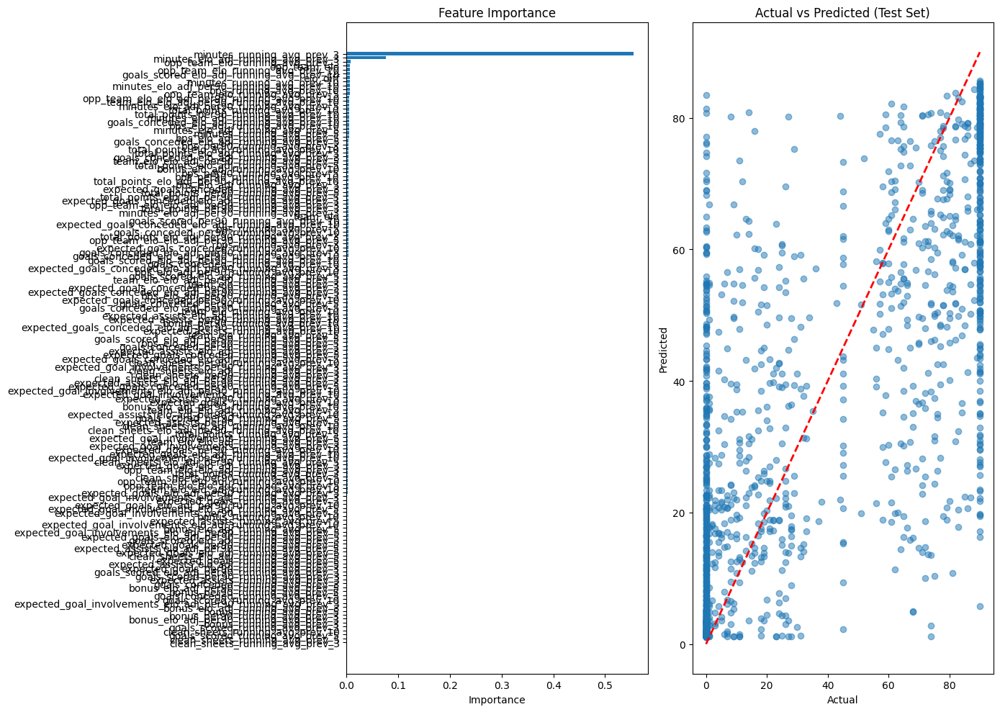

Cleaned df size: 28665/49859

Training Set Performance:
R² Score: 0.6835
RMSE: 21.6082
MAE: 15.8000

Test Set Performance:
R² Score: 0.5375
RMSE: 26.0356
MAE: 18.7901

Feature Importance:
                                                     feature  importance
                                  minutes_running_avg_prev_3    0.721720
                          minutes_elo_adj_running_avg_prev_3    0.024748
                                  minutes_running_avg_prev_5    0.013461
                                     bps_running_avg_prev_10    0.007785
                                 minutes_running_avg_prev_10    0.007126
                          minutes_elo_adj_running_avg_prev_5    0.005940
                                                opp_team_elo    0.004585
                            opp_team_elo_running_avg_prev_10    0.004142
                                                    elo_diff    0.003935
                       total_points_per90_running_avg_prev_3    0.003884
         

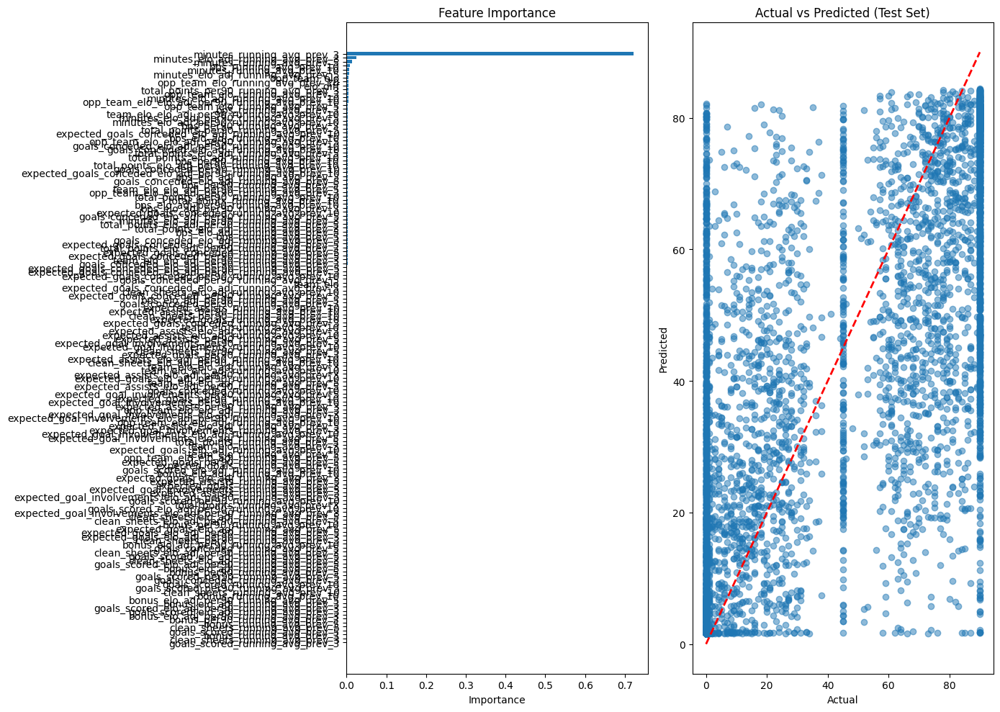

Cleaned df size: 21731/39073

Training Set Performance:
R² Score: 0.6589
RMSE: 24.6469
MAE: 18.1196

Test Set Performance:
R² Score: 0.4642
RMSE: 30.9247
MAE: 22.8072

Feature Importance:
                                                     feature  importance
                                  minutes_running_avg_prev_3    0.694692
                          minutes_elo_adj_running_avg_prev_3    0.025858
                                 minutes_running_avg_prev_10    0.008443
                            opp_team_elo_running_avg_prev_10    0.007072
                             opp_team_elo_running_avg_prev_5    0.006499
                             opp_team_elo_running_avg_prev_3    0.006419
                                                opp_team_elo    0.006354
                                                    elo_diff    0.005864
                                  minutes_running_avg_prev_5    0.005029
                                     bps_running_avg_prev_10    0.004675
         

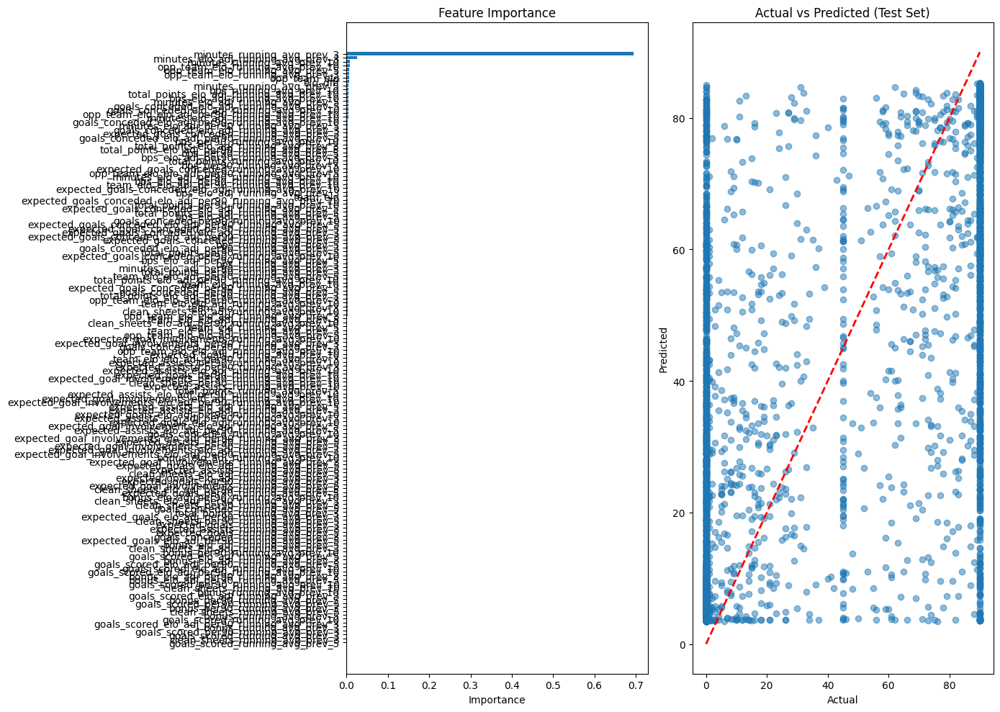

Cleaned df size: 4645/8287

Training Set Performance:
R² Score: 0.8391
RMSE: 17.9413
MAE: 10.1088

Test Set Performance:
R² Score: 0.7304
RMSE: 23.2220
MAE: 13.6912

Feature Importance:
                                                     feature  importance
                                  minutes_running_avg_prev_3    0.442616
                     total_points_elo_adj_running_avg_prev_3    0.091062
                          minutes_elo_adj_running_avg_prev_3    0.063108
                       total_points_per90_running_avg_prev_3    0.055759
                             total_points_running_avg_prev_3    0.047029
               total_points_elo_adj_per90_running_avg_prev_3    0.016777
                                bps_per90_running_avg_prev_3    0.013069
                        bps_elo_adj_per90_running_avg_prev_3    0.009926
                            opp_team_elo_running_avg_prev_10    0.009906
                             opp_team_elo_running_avg_prev_5    0.008366
           

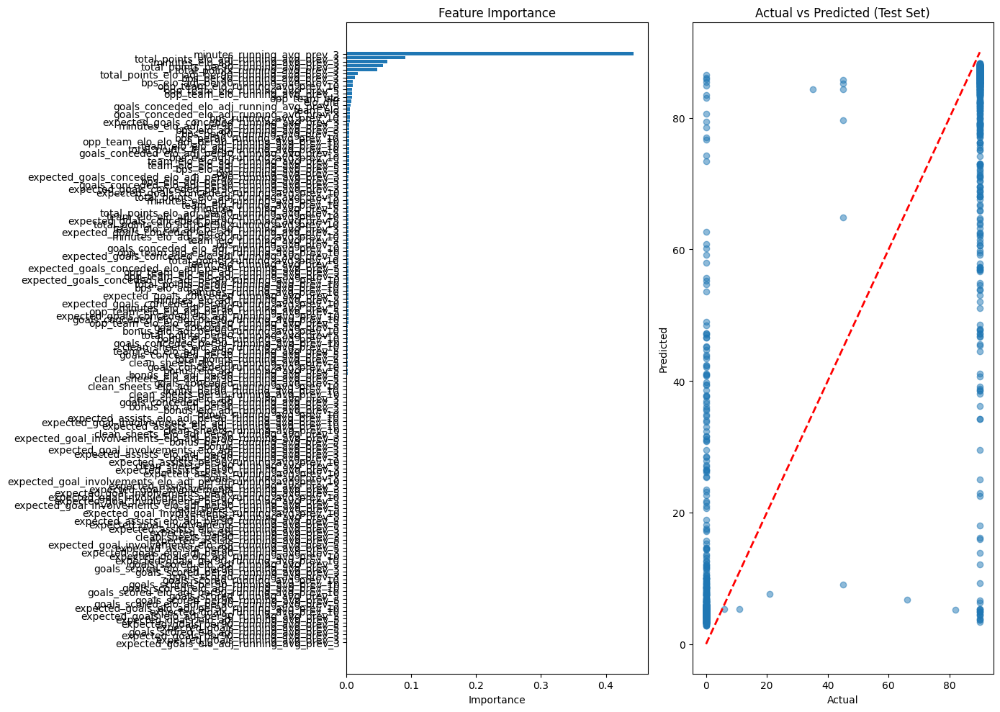

In [ ]:
filtered = (df['player_season_minutes_total']>0)#&(df['total_points']<15)#&(df['minutes']>45)

if __name__ == "__main__":
    
    FWD_mins_predictor = FPLPredictor(
        data=df[filtered],
        target='minutes',
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols
        )
    FWD_mins_predictor.fit()
    FWD_mins_predictor.plot_results()

    MID_mins_predictor = FPLPredictor(
        data=df[filtered],
        target='minutes',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_mins_predictor.fit()
    MID_mins_predictor.plot_results()

    DEF_mins_predictor = FPLPredictor(
        data=df[filtered],
        target='minutes',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_mins_predictor.fit()
    DEF_mins_predictor.plot_results()

    GK_mins_predictor = FPLPredictor(
        data=df[filtered],
        target='minutes',
        positions={'GK'},
        columns_to_drop = cbi_defcon_cols)
    GK_mins_predictor.fit()
    GK_mins_predictor.plot_results()

target=expected_goals_per90, FWD_xG_predictor
Cleaned df size: 2386/4106

Training Set Performance:
R² Score: 0.6173
RMSE: 0.2807
MAE: 0.2133

Test Set Performance:
R² Score: 0.0837
RMSE: 0.4266
MAE: 0.3104

Feature Importance:
                                                     feature  importance
expected_goal_involvements_elo_adj_per90_running_avg_prev_10    0.069074
                                                    elo_diff    0.066625
                                                opp_team_elo    0.029036
            expected_goals_elo_adj_per90_running_avg_prev_10    0.027736
        expected_goal_involvements_per90_running_avg_prev_10    0.024298
                 expected_goals_conceded_running_avg_prev_10    0.015997
      expected_goal_involvements_elo_adj_running_avg_prev_10    0.014073
              goals_scored_elo_adj_per90_running_avg_prev_10    0.012777
                             opp_team_elo_running_avg_prev_5    0.012624
         expected_goal_involvements_per90_

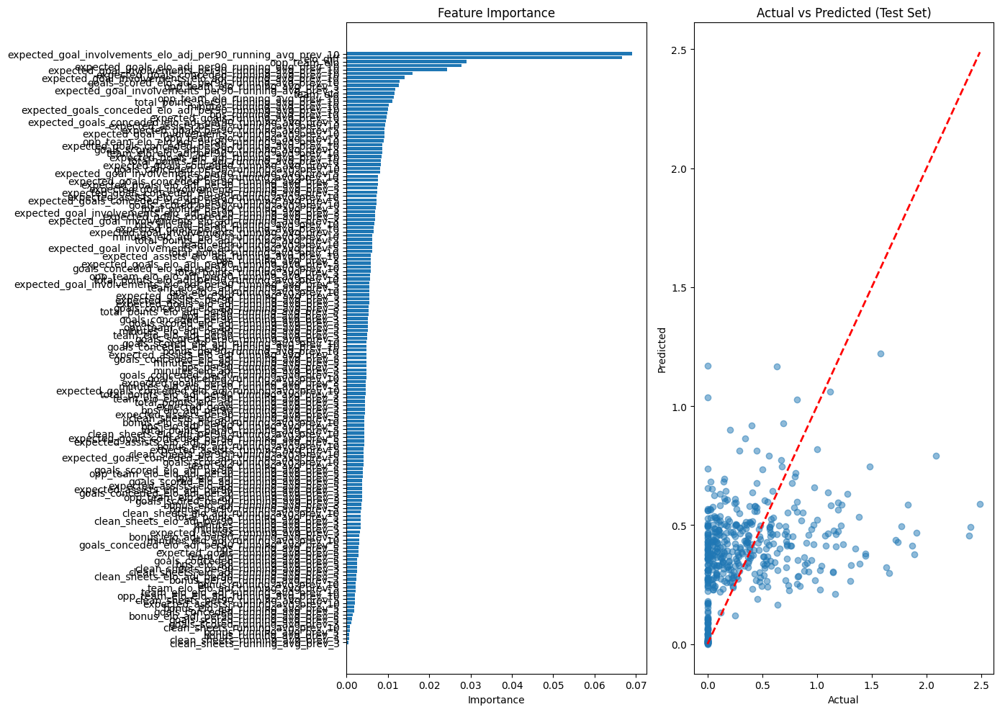

target=expected_goals_per90, MID_xG_predictor
Cleaned df size: 10704/17006

Training Set Performance:
R² Score: 0.5435
RMSE: 0.1708
MAE: 0.1129

Test Set Performance:
R² Score: 0.1461
RMSE: 0.2398
MAE: 0.1432

Feature Importance:
                                                     feature  importance
                          expected_goals_running_avg_prev_10    0.107219
                    expected_goals_per90_running_avg_prev_10    0.071508
                  expected_goals_elo_adj_running_avg_prev_10    0.065844
                                                opp_team_elo    0.035117
            expected_goals_elo_adj_per90_running_avg_prev_10    0.020168
                                                    elo_diff    0.017548
        expected_goal_involvements_per90_running_avg_prev_10    0.015462
                             opp_team_elo_running_avg_prev_5    0.015264
                             opp_team_elo_running_avg_prev_3    0.014494
                            opp_team_elo

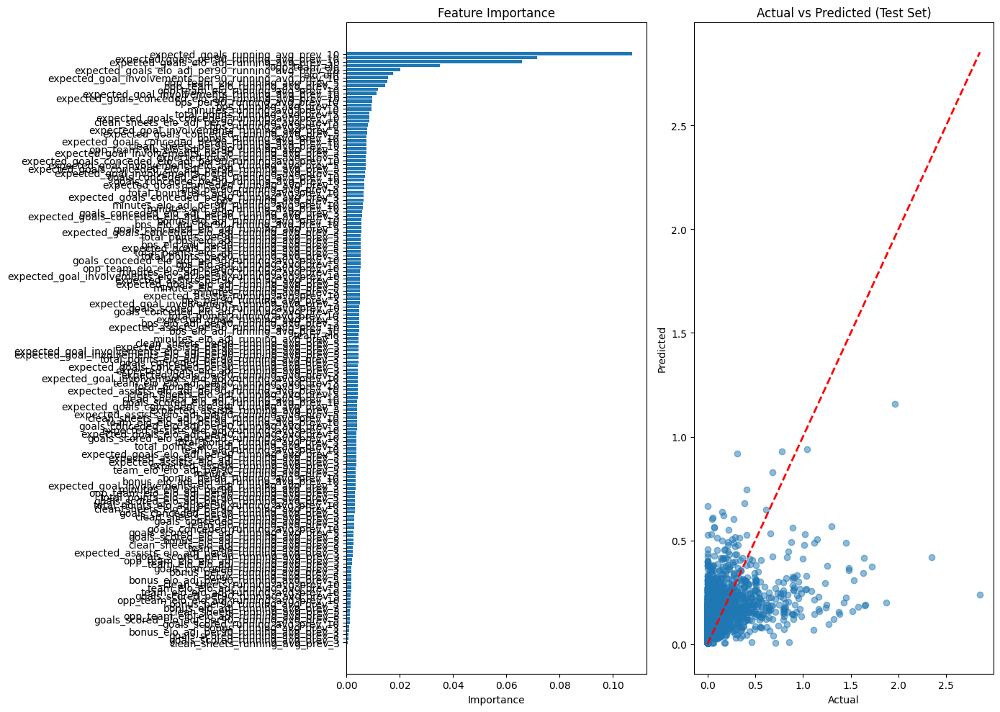

target=expected_goals_per90, DEF_xG_predictor
Cleaned df size: 9203/15001

Training Set Performance:
R² Score: 0.3251
RMSE: 0.0951
MAE: 0.0549

Test Set Performance:
R² Score: 0.0002
RMSE: 0.1172
MAE: 0.0623

Feature Importance:
                                                     feature  importance
            expected_goals_elo_adj_per90_running_avg_prev_10    0.052664
                                                opp_team_elo    0.037770
                             bps_elo_adj_running_avg_prev_10    0.031451
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.027714
                                                    elo_diff    0.025653
                    total_points_elo_adj_running_avg_prev_10    0.024060
                 expected_goals_conceded_running_avg_prev_10    0.022346
            expected_goals_conceded_per90_running_avg_prev_5    0.020663
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.018420
                    expected_goals_per90_

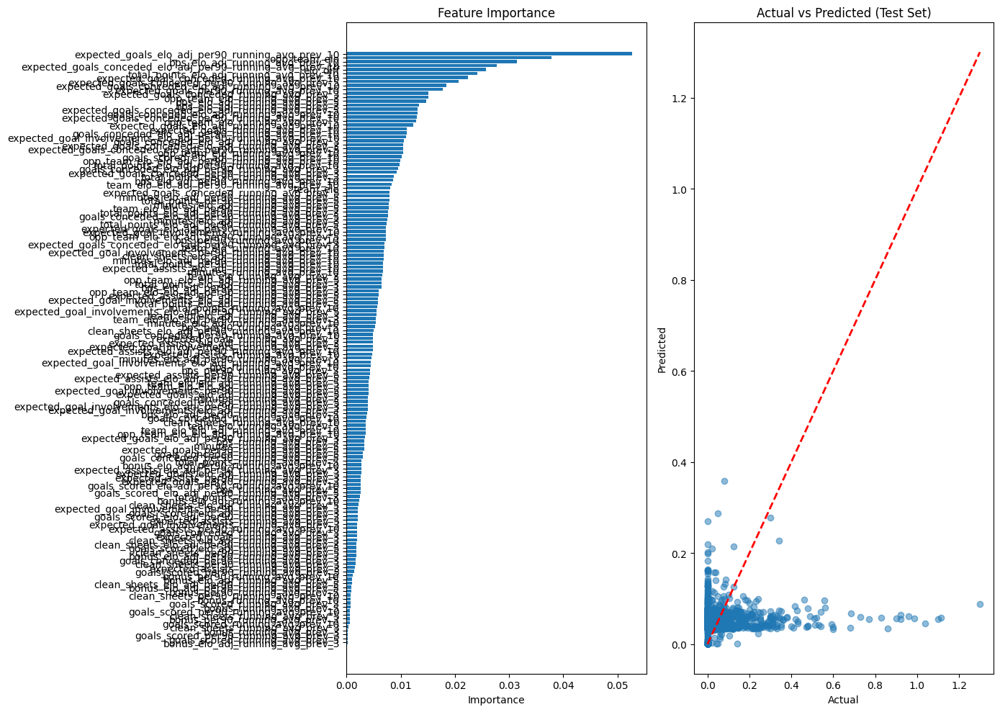

In [ ]:
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>500)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=expected_goals_per90, FWD_xG_predictor")
    FWD_xG_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_per90',
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols)
    FWD_xG_predictor.fit()
    FWD_xG_predictor.plot_results()

    print("target=expected_goals_per90, MID_xG_predictor")
    MID_xG_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_per90',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_xG_predictor.fit()
    MID_xG_predictor.plot_results()
    
    print("target=expected_goals_per90, DEF_xG_predictor")
    DEF_xG_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_per90',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_xG_predictor.fit()
    DEF_xG_predictor.plot_results()

target=expected_assists_per90, FWD_xA_predictor
Cleaned df size: 2386/4106

Training Set Performance:
R² Score: 0.5992
RMSE: 0.0789
MAE: 0.0524

Test Set Performance:
R² Score: -0.0087
RMSE: 0.1250
MAE: 0.0770

Feature Importance:
                                                     feature  importance
                expected_assists_elo_adj_running_avg_prev_10    0.075204
                 expected_assists_elo_adj_running_avg_prev_3    0.051509
                                                    elo_diff    0.030183
                 expected_assists_elo_adj_running_avg_prev_5    0.027809
                             opp_team_elo_running_avg_prev_3    0.023803
                                                opp_team_elo    0.020008
                        expected_assists_running_avg_prev_10    0.018900
                                bps_per90_running_avg_prev_3    0.015990
          expected_assists_elo_adj_per90_running_avg_prev_10    0.015379
                   goals_conceded_elo_a

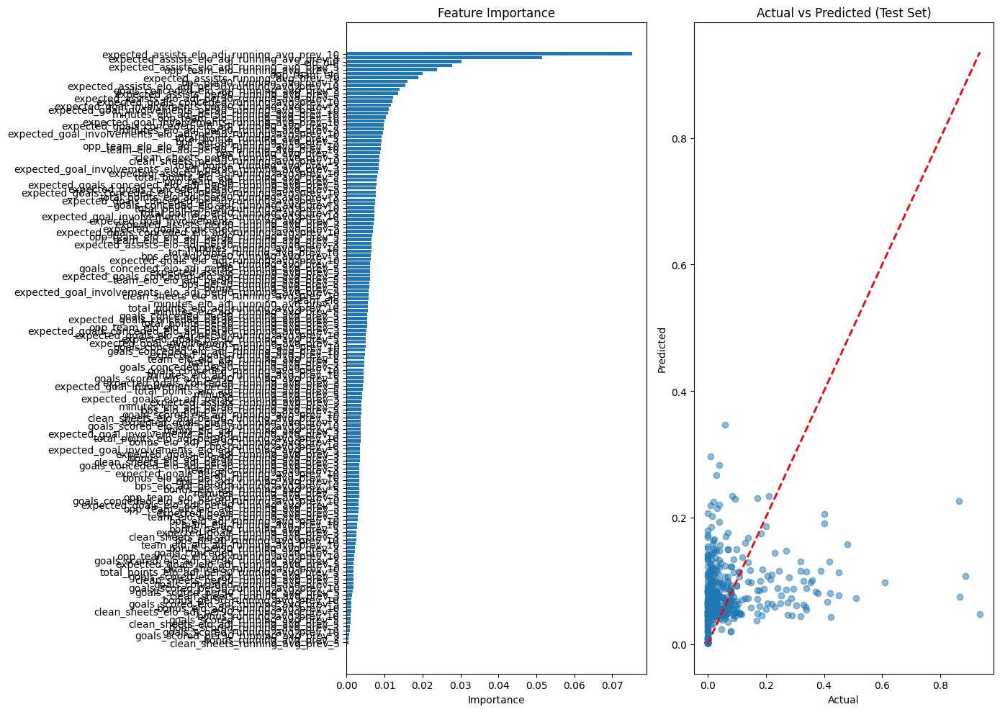

target=expected_assists_per90, MID_xA_predictor
Cleaned df size: 10704/17006

Training Set Performance:
R² Score: 0.4845
RMSE: 0.1164
MAE: 0.0792

Test Set Performance:
R² Score: 0.1549
RMSE: 0.1534
MAE: 0.0984

Feature Importance:
                                                     feature  importance
                expected_assists_elo_adj_running_avg_prev_10    0.126550
          expected_assists_elo_adj_per90_running_avg_prev_10    0.084909
                                                    elo_diff    0.039389
                                                opp_team_elo    0.037405
                        expected_assists_running_avg_prev_10    0.021151
      expected_goal_involvements_elo_adj_running_avg_prev_10    0.019678
                  expected_assists_per90_running_avg_prev_10    0.019077
expected_goal_involvements_elo_adj_per90_running_avg_prev_10    0.017816
                                 minutes_running_avg_prev_10    0.012597
                 expected_assists_elo_

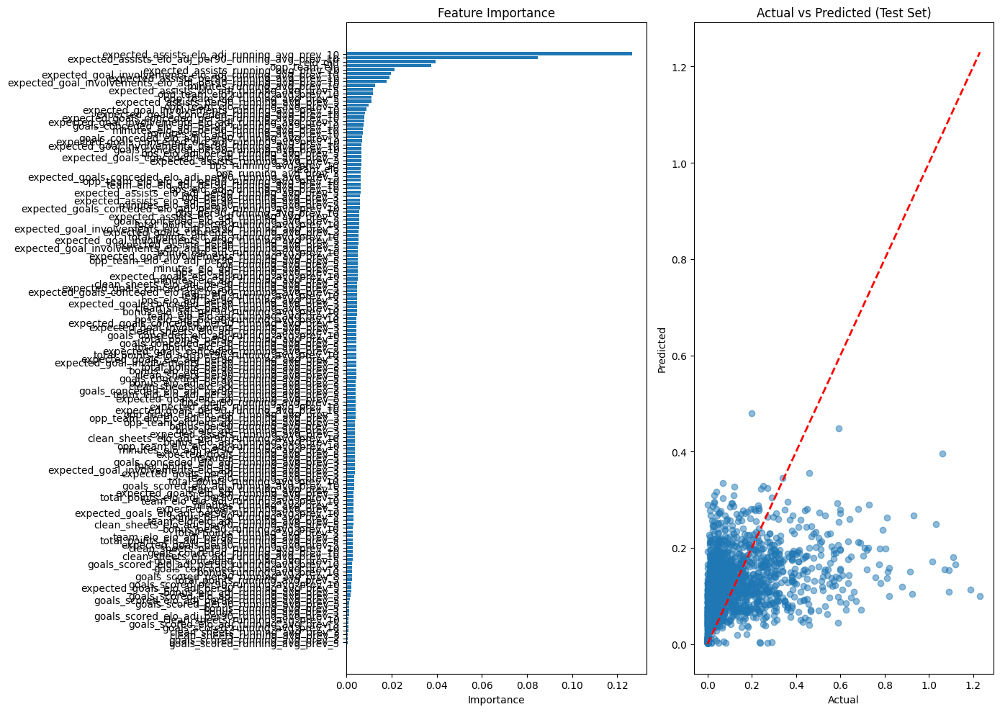

target=expected_assists_per90, DEF_xA_predictor
Cleaned df size: 9203/15001

Training Set Performance:
R² Score: 0.4750
RMSE: 0.0757
MAE: 0.0444

Test Set Performance:
R² Score: 0.0879
RMSE: 0.0963
MAE: 0.0528

Feature Importance:
                                                     feature  importance
          expected_assists_elo_adj_per90_running_avg_prev_10    0.100688
                  expected_assists_per90_running_avg_prev_10    0.061459
                expected_assists_elo_adj_running_avg_prev_10    0.049663
                        expected_assists_running_avg_prev_10    0.035022
                                                opp_team_elo    0.034487
                                                    elo_diff    0.022300
                 expected_assists_elo_adj_running_avg_prev_5    0.019925
                             opp_team_elo_running_avg_prev_3    0.018072
                             opp_team_elo_running_avg_prev_5    0.017920
                         expected_assis

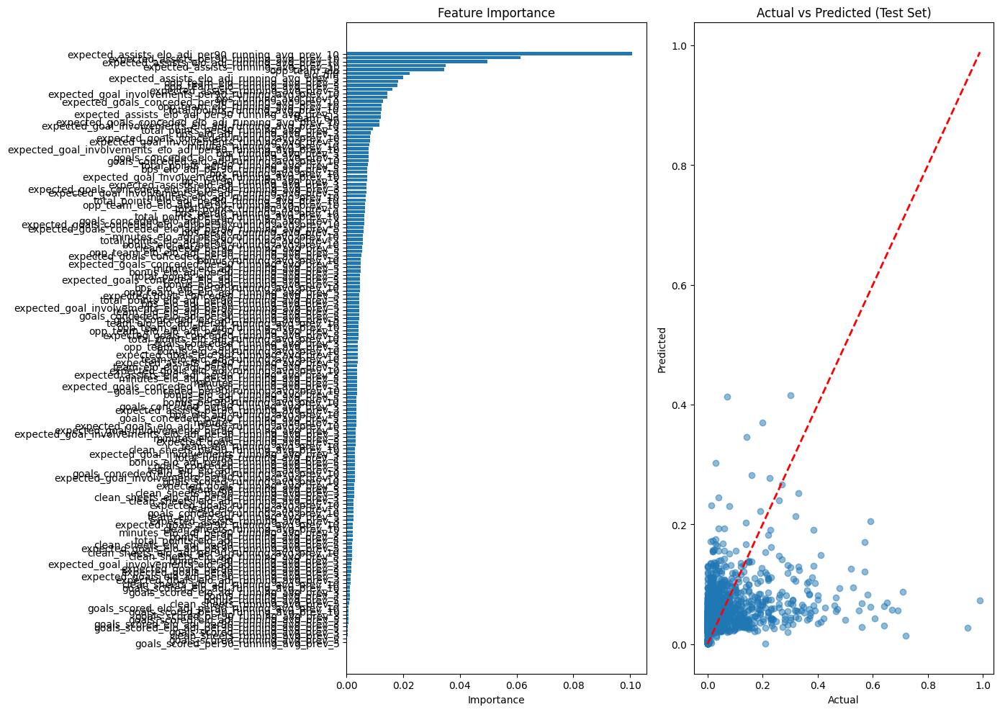

In [ ]:
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>500)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=expected_assists_per90, FWD_xA_predictor")
    FWD_xA_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_assists_per90',
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols)
    FWD_xA_predictor.fit()
    FWD_xA_predictor.plot_results()

    print("target=expected_assists_per90, MID_xA_predictor")
    MID_xA_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_assists_per90',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_xA_predictor.fit()
    MID_xA_predictor.plot_results()
    
    print("target=expected_assists_per90, DEF_xA_predictor")
    DEF_xA_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_assists_per90',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_xA_predictor.fit()
    DEF_xA_predictor.plot_results()

target=expected_goals_conceded_per90, FWD_xGC_predictor
Cleaned df size: 2386/4106

Training Set Performance:
R² Score: 0.7453
RMSE: 0.4709
MAE: 0.3681

Test Set Performance:
R² Score: 0.2843
RMSE: 0.8239
MAE: 0.6098

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.169207
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.115680
           expected_goals_conceded_per90_running_avg_prev_10    0.076491
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.032108
                 expected_goals_conceded_running_avg_prev_10    0.028512
                                                opp_team_elo    0.017531
                            opp_team_elo_running_avg_prev_10    0.015437
          expected_goals_conceded_elo_adj_running_avg_prev_5    0.015270
                             opp_team_elo_running_avg_prev_5    0.012314
                    expected_goa

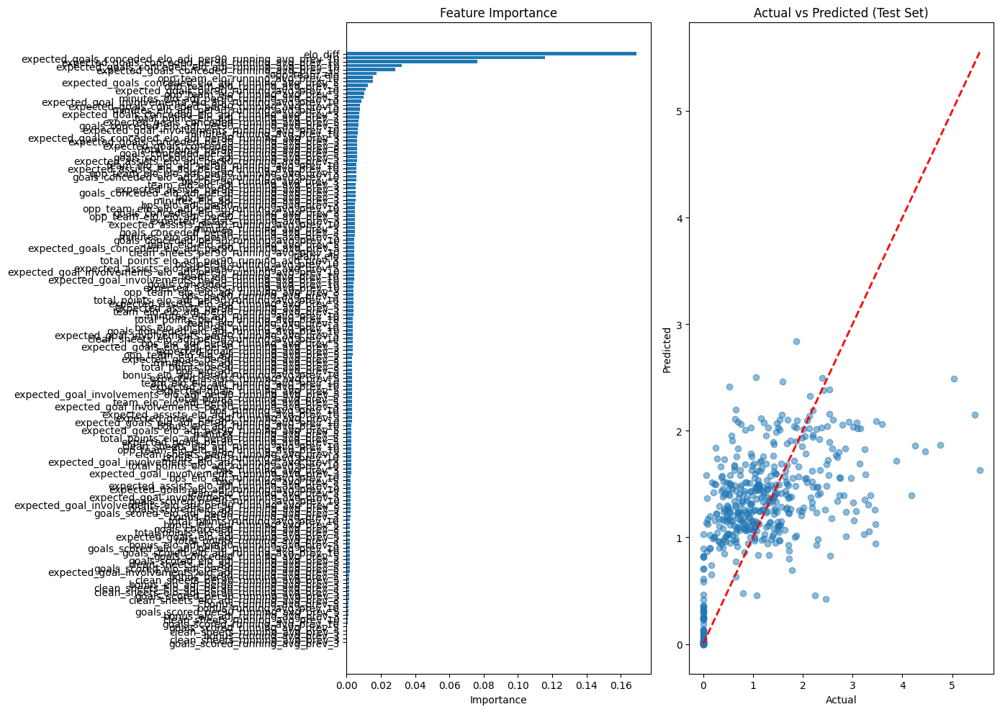

target=expected_goals_conceded_per90, MID_xGC_predictor
Cleaned df size: 10704/17006

Training Set Performance:
R² Score: 0.6312
RMSE: 0.5758
MAE: 0.4377

Test Set Performance:
R² Score: 0.4603
RMSE: 0.7092
MAE: 0.5199

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.251278
           expected_goals_conceded_per90_running_avg_prev_10    0.152638
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.074772
                 expected_goals_conceded_running_avg_prev_10    0.051957
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.050869
                                                opp_team_elo    0.024560
                             opp_team_elo_running_avg_prev_5    0.024232
                             opp_team_elo_running_avg_prev_3    0.019058
                            opp_team_elo_running_avg_prev_10    0.017157
          expected_goals_conce

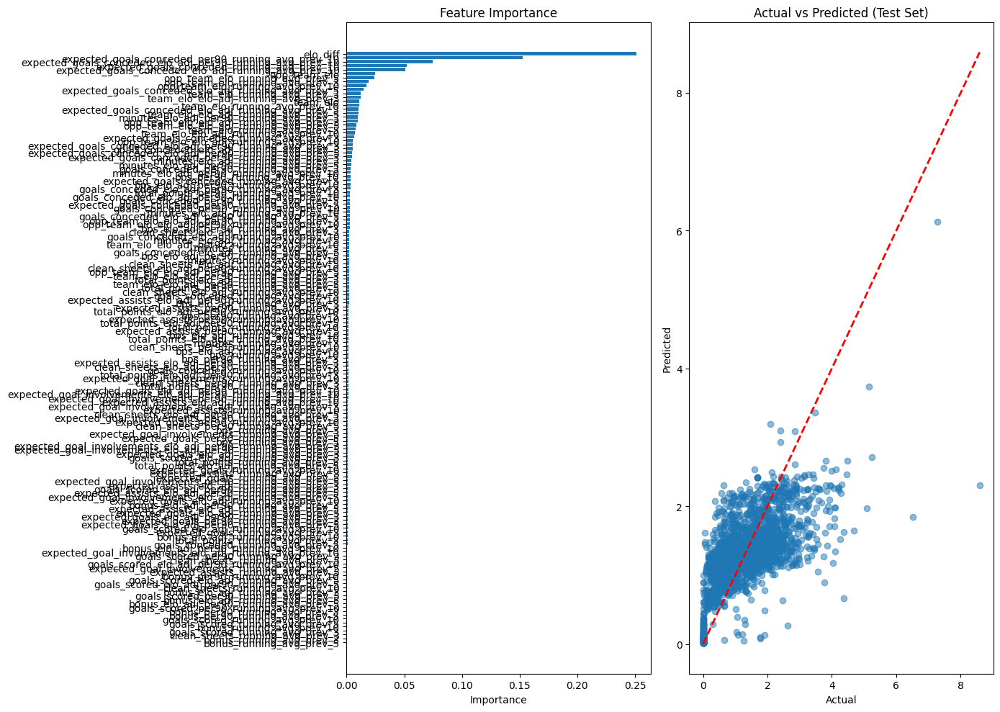

target=expected_goals_conceded_per90, DEF_xGC_predictor
Cleaned df size: 9203/15001

Training Set Performance:
R² Score: 0.6687
RMSE: 0.5514
MAE: 0.4164

Test Set Performance:
R² Score: 0.4575
RMSE: 0.6838
MAE: 0.5161

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.226803
           expected_goals_conceded_per90_running_avg_prev_10    0.169256
                 expected_goals_conceded_running_avg_prev_10    0.062203
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.046454
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.033777
                                                opp_team_elo    0.026968
                             opp_team_elo_running_avg_prev_5    0.023299
                             opp_team_elo_running_avg_prev_3    0.020061
                            opp_team_elo_running_avg_prev_10    0.019116
                     opp_team_e

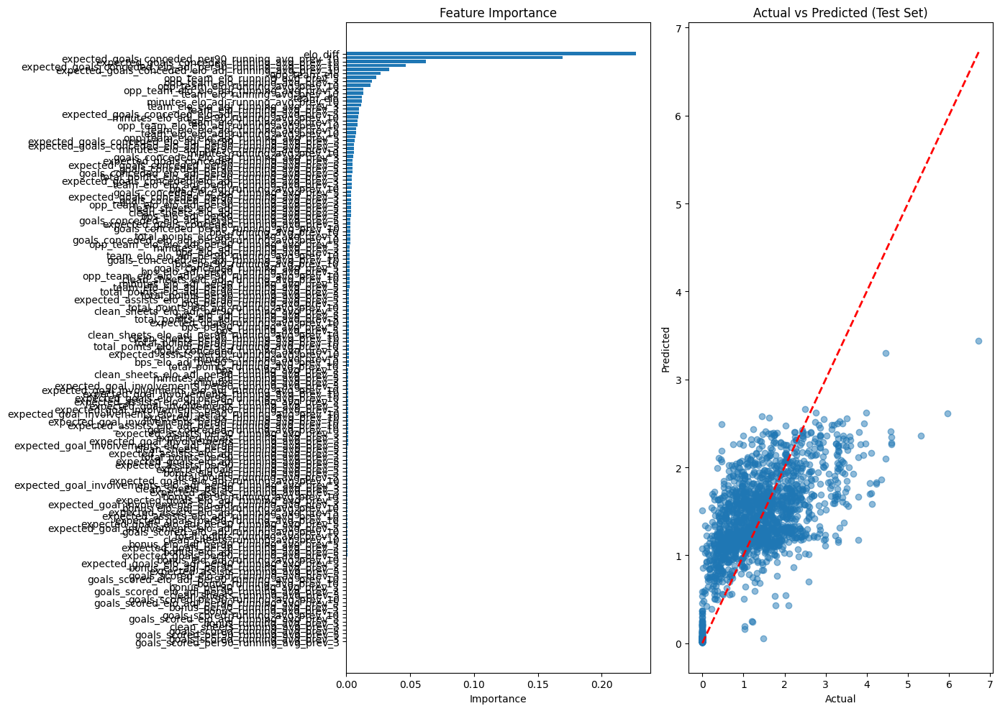

target=expected_goals_conceded_per90, GK_xGC_predictor
Cleaned df size: 2277/3659

Training Set Performance:
R² Score: 0.7226
RMSE: 0.4898
MAE: 0.3765

Test Set Performance:
R² Score: 0.3209
RMSE: 0.7487
MAE: 0.5752

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.215650
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.120905
           expected_goals_conceded_per90_running_avg_prev_10    0.083998
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.034380
                 expected_goals_conceded_running_avg_prev_10    0.030621
                                                opp_team_elo    0.023360
                            opp_team_elo_running_avg_prev_10    0.018093
          expected_goals_conceded_elo_adj_running_avg_prev_5    0.017990
                             opp_team_elo_running_avg_prev_5    0.015082
                   goals_conceded

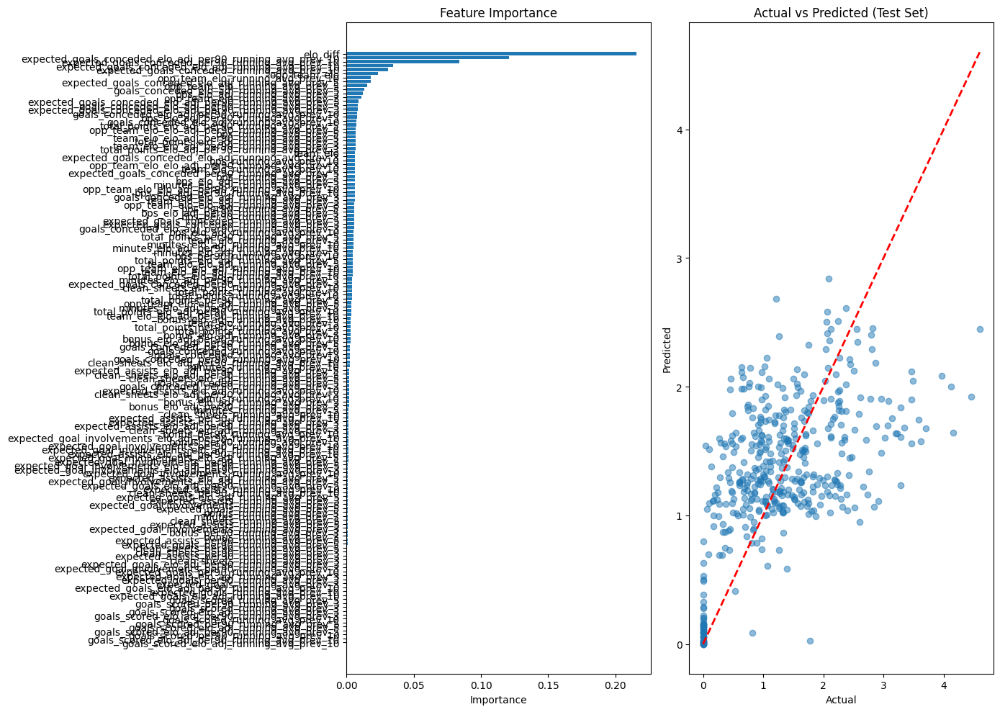

In [ ]:
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>500)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=expected_goals_conceded_per90, FWD_xGC_predictor")
    FWD_xGC_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_conceded_per90',
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols)
    FWD_xGC_predictor.fit()
    FWD_xGC_predictor.plot_results()

    print("target=expected_goals_conceded_per90, MID_xGC_predictor")
    MID_xGC_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_conceded_per90',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_xGC_predictor.fit()
    MID_xGC_predictor.plot_results()
    
    print("target=expected_goals_conceded_per90, DEF_xGC_predictor")
    DEF_xGC_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_conceded_per90',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_xGC_predictor.fit()
    DEF_xGC_predictor.plot_results()

    print("target=expected_goals_conceded_per90, GK_xGC_predictor")
    GK_xGC_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_conceded_per90',
        positions={'GK'},
        columns_to_drop = cbi_defcon_cols)
    GK_xGC_predictor.fit()
    GK_xGC_predictor.plot_results()

target=bps_per90, FWD_bps_predictor
Cleaned df size: 2386/4106

Training Set Performance:
R² Score: 0.5965
RMSE: 12.2754
MAE: 10.0397

Test Set Performance:
R² Score: -0.0007
RMSE: 19.3771
MAE: 15.4066

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.057445
                                                opp_team_elo    0.025588
                            opp_team_elo_running_avg_prev_10    0.024635
                             opp_team_elo_running_avg_prev_3    0.019259
                    minutes_elo_adj_per90_running_avg_prev_3    0.016612
                             opp_team_elo_running_avg_prev_5    0.014851
                    minutes_elo_adj_per90_running_avg_prev_5    0.014292
              total_points_elo_adj_per90_running_avg_prev_10    0.012786
              clean_sheets_elo_adj_per90_running_avg_prev_10    0.012011
                             bps_elo_adj_runnin

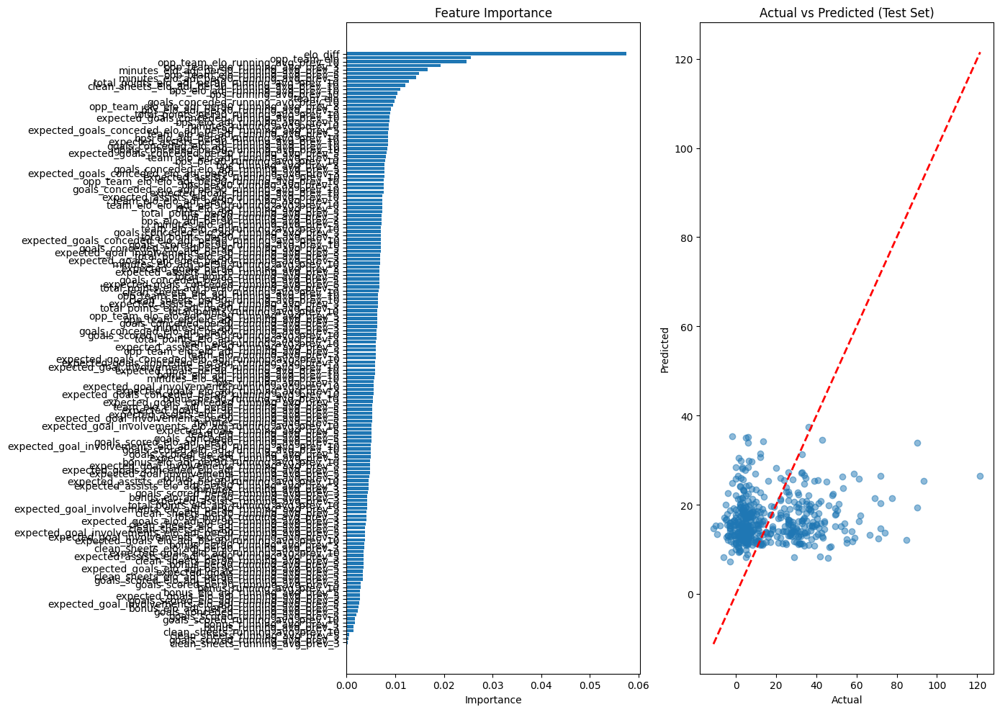

target=bps_per90, MID_bps_predictor
Cleaned df size: 10704/17006

Training Set Performance:
R² Score: 0.3945
RMSE: 9.0698
MAE: 6.9939

Test Set Performance:
R² Score: 0.0564
RMSE: 11.5311
MAE: 8.3137

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.100661
                                     bps_running_avg_prev_10    0.025172
                                                opp_team_elo    0.022093
          expected_assists_elo_adj_per90_running_avg_prev_10    0.021022
                            opp_team_elo_running_avg_prev_10    0.018527
                expected_assists_elo_adj_running_avg_prev_10    0.018366
                             opp_team_elo_running_avg_prev_5    0.016664
                             opp_team_elo_running_avg_prev_3    0.015567
                  expected_assists_per90_running_avg_prev_10    0.014282
                        expected_assists_running_

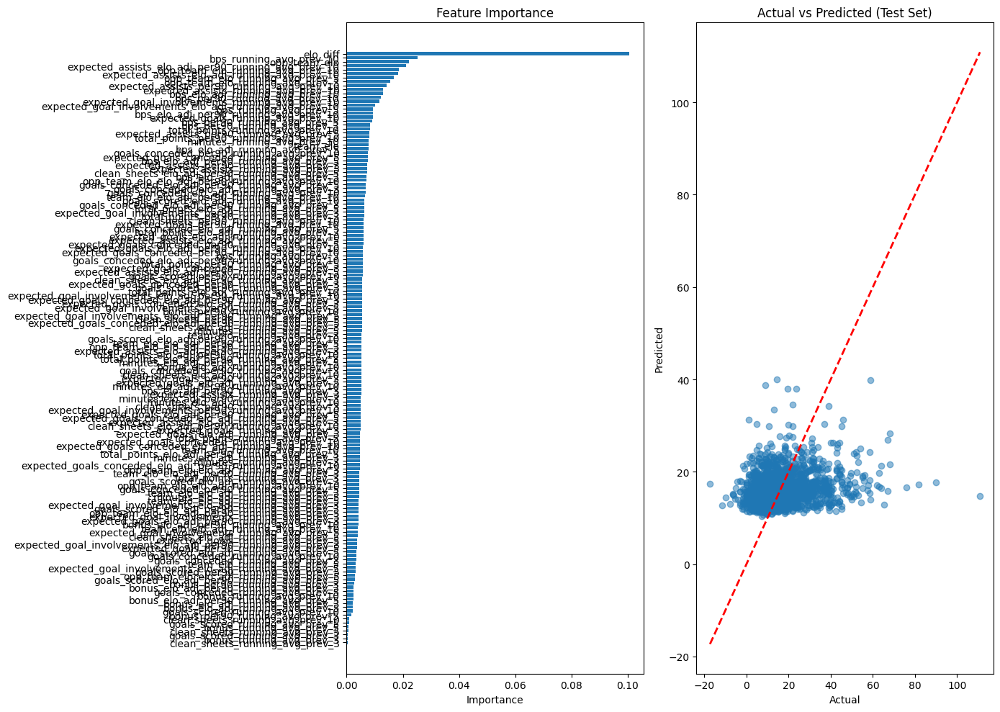

target=bps_per90, DEF_bps_predictor
Cleaned df size: 9203/15001

Training Set Performance:
R² Score: 0.4944
RMSE: 7.2706
MAE: 5.8351

Test Set Performance:
R² Score: 0.1634
RMSE: 9.1761
MAE: 7.2799

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.198869
                                                opp_team_elo    0.029519
                             opp_team_elo_running_avg_prev_5    0.022192
                             opp_team_elo_running_avg_prev_3    0.020949
                               bps_per90_running_avg_prev_10    0.018790
                            opp_team_elo_running_avg_prev_10    0.017796
                                team_elo_running_avg_prev_10    0.015977
                                                    team_elo    0.014152
                                 team_elo_running_avg_prev_3    0.011771
                                bps_per90_running_a

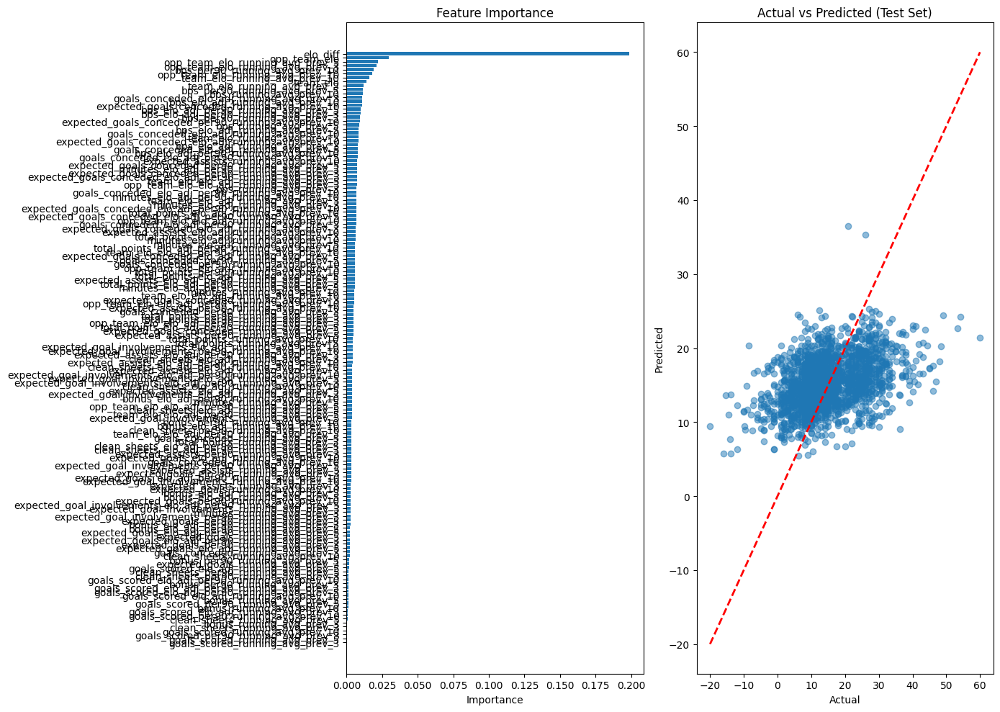

target=bps_per90, GK_bps_predictor
Cleaned df size: 2277/3659

Training Set Performance:
R² Score: 0.6416
RMSE: 5.4990
MAE: 4.5002

Test Set Performance:
R² Score: 0.0011
RMSE: 9.3200
MAE: 7.5209

Feature Importance:
                                                     feature   importance
                                                opp_team_elo 4.151055e-02
                               bps_per90_running_avg_prev_10 4.102483e-02
                            opp_team_elo_running_avg_prev_10 3.693270e-02
                             opp_team_elo_running_avg_prev_3 3.035368e-02
                                                    elo_diff 2.614281e-02
                             opp_team_elo_running_avg_prev_5 2.561175e-02
                                     bps_running_avg_prev_10 2.321404e-02
           expected_goals_conceded_per90_running_avg_prev_10 1.987453e-02
                              bps_elo_adj_running_avg_prev_5 1.805296e-02
                       bps_elo_adj_per90_ru

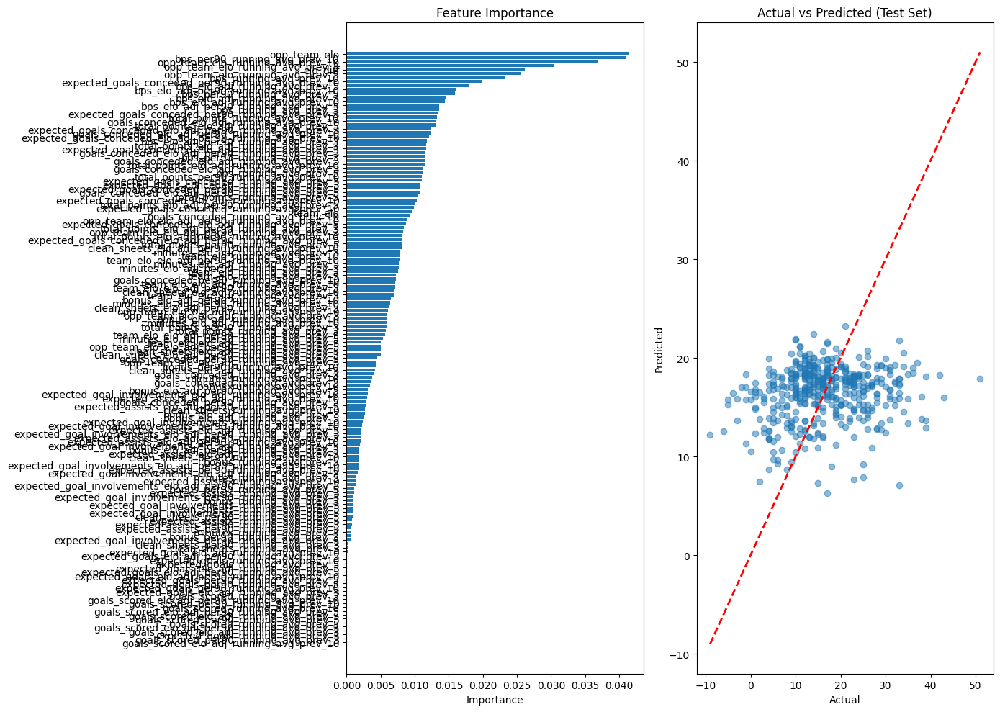

In [ ]:
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>500)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=bps_per90, FWD_bps_predictor")
    FWD_bps_predictor = FPLPredictor(
        data=df[filtered],
        target='bps_per90', # try: 'bonus_per90'
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols)
    FWD_bps_predictor.fit()
    FWD_bps_predictor.plot_results()

    print("target=bps_per90, MID_bps_predictor")
    MID_bps_predictor = FPLPredictor(
        data=df[filtered],
        target='bps_per90',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_bps_predictor.fit()
    MID_bps_predictor.plot_results()
    
    print("target=bps_per90, DEF_bps_predictor")
    DEF_bps_predictor = FPLPredictor(
        data=df[filtered],
        target='bps_per90',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_bps_predictor.fit()
    DEF_bps_predictor.plot_results()

    print("target=bps_per90, GK_bps_predictor")
    GK_bps_predictor = FPLPredictor(
        data=df[filtered],
        target='bps_per90',
        positions={'GK'},
        columns_to_drop = cbi_defcon_cols)
    GK_bps_predictor.fit()
    GK_bps_predictor.plot_results()

target=saves_per90, GK_saves_predictor
Cleaned df size: 217/3819

Training Set Performance:
R² Score: 0.8494
RMSE: 0.6298
MAE: 0.5066

Test Set Performance:
R² Score: 0.1071
RMSE: 1.8409
MAE: 1.4309

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.050303
                            opp_team_elo_running_avg_prev_10    0.042801
                             opp_team_elo_running_avg_prev_5    0.036560
                                team_elo_running_avg_prev_10    0.029431
                  team_elo_elo_adj_per90_running_avg_prev_10    0.024558
                                recoveries_per90_alltime_avg    0.023687
                                 team_elo_running_avg_prev_5    0.022793
                                                opp_team_elo    0.022616
                                                    team_elo    0.020763
                             opp_team_elo_running_

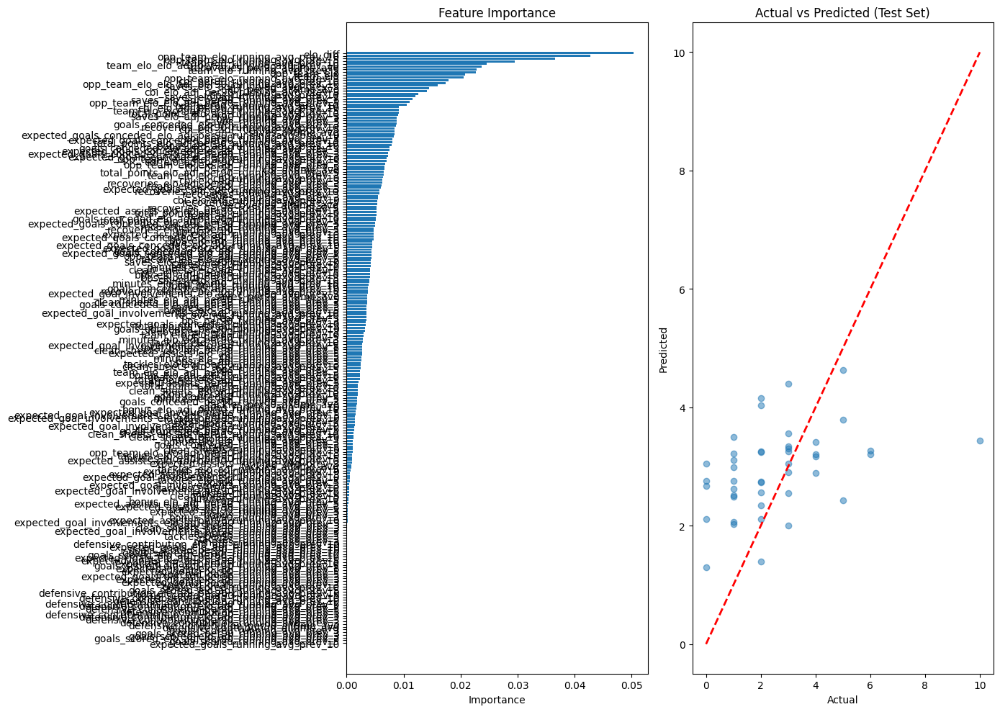

In [ ]:
#shots saved
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>0)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=saves_per90, GK_saves_predictor")
    GK_saves_predictor = FPLPredictor(
    data=df[filtered],
    target='saves_per90',
    positions={'GK'})
    GK_saves_predictor.fit()
    GK_saves_predictor.plot_results()

target=defensive_contribution_per90, FWD_defcon_predictor
Cleaned df size: 237/4710

Training Set Performance:
R² Score: 0.8434
RMSE: 0.9890
MAE: 0.7584

Test Set Performance:
R² Score: -0.2558
RMSE: 4.1014
MAE: 2.8021

Feature Importance:
                                                     feature  importance
                         expected_assists_running_avg_prev_3    0.037511
                             opp_team_elo_running_avg_prev_5    0.021003
                            opp_team_elo_running_avg_prev_10    0.015411
                       recoveries_elo_adj_running_avg_prev_3    0.014271
                      recoveries_elo_adj_running_avg_prev_10    0.014144
                  defensive_contribution_running_avg_prev_10    0.013874
                             opp_team_elo_running_avg_prev_3    0.013287
                                recoveries_per90_alltime_avg    0.013229
     defensive_contribution_elo_adj_per90_running_avg_prev_5    0.012902
             defensive_contrib

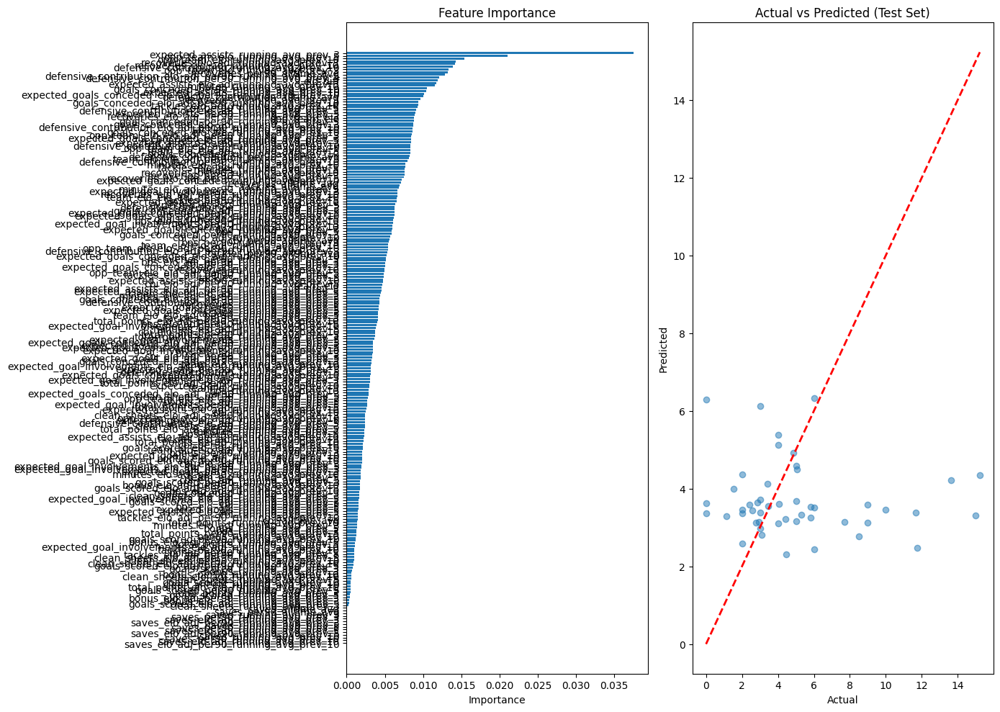

target=defensive_contribution_per90, MID_defcon_predictor
Cleaned df size: 1133/19396

Training Set Performance:
R² Score: 0.8333
RMSE: 1.6286
MAE: 1.3292

Test Set Performance:
R² Score: 0.0849
RMSE: 3.9046
MAE: 3.0046

Feature Importance:
                                                     feature  importance
                           tackles_per90_running_avg_prev_10    0.031251
                                         tackles_alltime_avg    0.029214
                    expected_goals_per90_running_avg_prev_10    0.020939
                                 tackles_running_avg_prev_10    0.020756
                               cbi_per90_running_avg_prev_10    0.016464
                                                opp_team_elo    0.014679
                                                    elo_diff    0.012085
                                     cbi_running_avg_prev_10    0.011701
                          defensive_contribution_alltime_avg    0.011694
                         tack

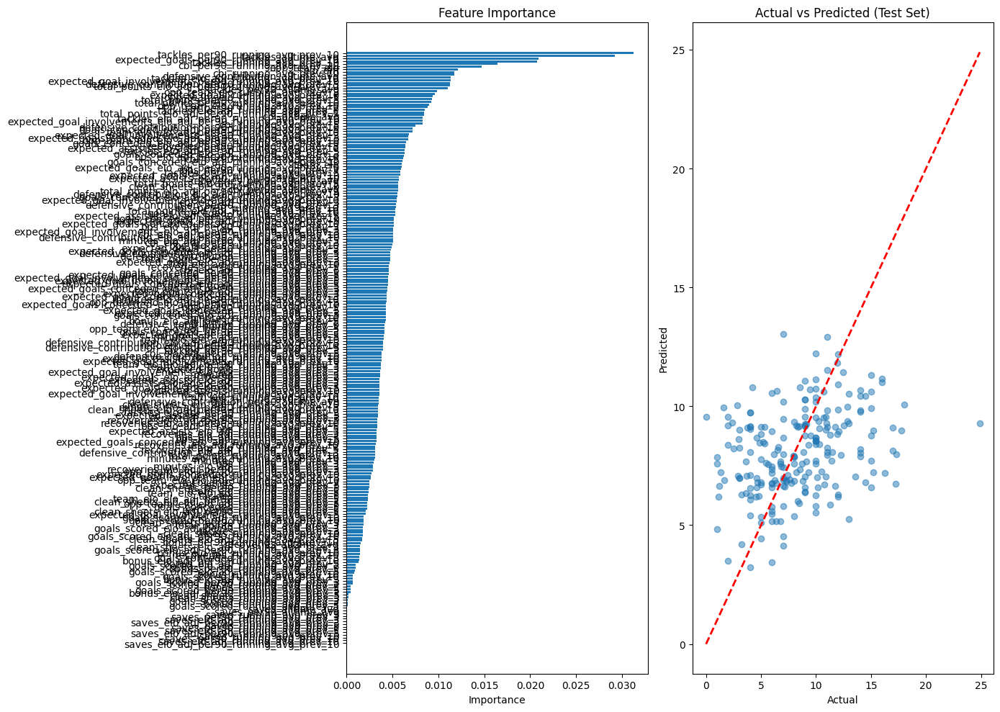

target=defensive_contribution_per90, DEF_defcon_predictor
Cleaned df size: 935/16395

Training Set Performance:
R² Score: 0.7875
RMSE: 1.7720
MAE: 1.4243

Test Set Performance:
R² Score: -0.0110
RMSE: 3.7280
MAE: 2.9076

Feature Importance:
                                                     feature  importance
          expected_assists_elo_adj_per90_running_avg_prev_10    0.036866
                                                    elo_diff    0.034636
               opp_team_elo_elo_adj_per90_running_avg_prev_5    0.027641
                                                opp_team_elo    0.027296
                                cbi_per90_running_avg_prev_3    0.026818
                             cbi_elo_adj_running_avg_prev_10    0.013093
                                     cbi_running_avg_prev_10    0.013038
                               cbi_per90_running_avg_prev_10    0.012006
                   expected_assists_per90_running_avg_prev_5    0.011858
                             

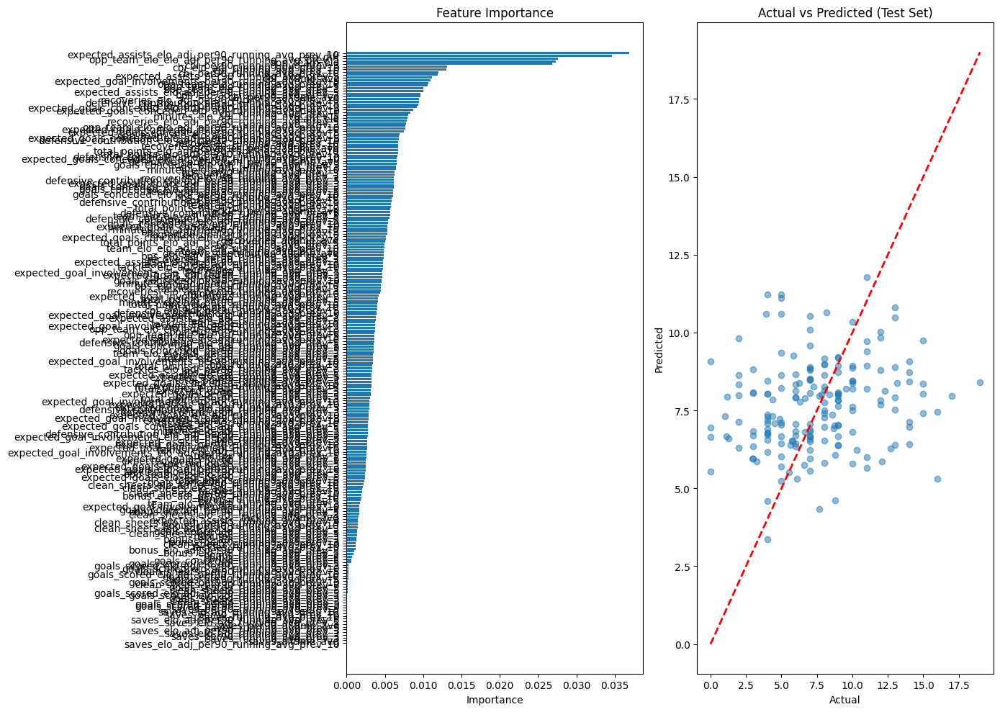

In [ ]:
# >10 defcon (CBIT) for a defender
# >12 defcon (CBIT+R) for mid or fwd
filtered = (df['minutes']>30)&(df['player_season_minutes_total']>0)

if __name__ == "__main__":
    
    print("target=defensive_contribution_per90, FWD_defcon_predictor")
    FWD_defcon_predictor = FPLPredictor(
    data=df[filtered],
    target='defensive_contribution_per90',
    positions={'FWD'})
    FWD_defcon_predictor.fit()
    FWD_defcon_predictor.plot_results()

    print("target=defensive_contribution_per90, MID_defcon_predictor")
    MID_defcon_predictor = FPLPredictor(
    data=df[filtered],
    target='defensive_contribution_per90',
    positions={'MID'})
    MID_defcon_predictor.fit()
    MID_defcon_predictor.plot_results()

    print("target=defensive_contribution_per90, DEF_defcon_predictor")
    DEF_defcon_predictor = FPLPredictor(
    data=df[filtered],
    target='defensive_contribution_per90',
    positions={'DEF'})
    DEF_defcon_predictor.fit()
    DEF_defcon_predictor.plot_results()

Goals conceded per 90
Estimated λ (mean goals per match): 1.342


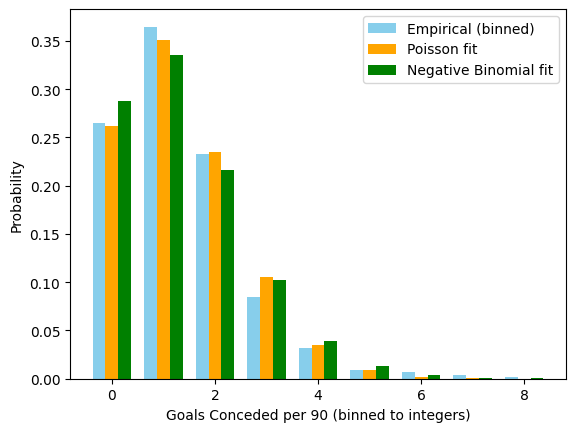

Mean: 1.334, Variance: 1.526
Overdispersion ratio (Var/Mean): 1.144
✅ Poisson assumption looks reasonable.
P(X < 1 goal) = 0.261


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import poisson, nbinom
print("Goals conceded per 90")

# Compute xGC per 90
df['xgc_p90'] = (df['expected_goals_conceded'] / df['minutes']) * 90

# Filter to reasonable samples
data = df[(df['minutes'] > 0) & (df['xgc_p90'] < 8)]['xgc_p90']

# Estimate λ
lambda_hat = np.mean(data)
print(f"Estimated λ (mean goals per match): {lambda_hat:.3f}")

# --- BINNING into discrete Poisson-like counts ---
binned = np.round(data).astype(int)
binned = np.clip(binned, 0, None)

# Empirical frequencies
values, counts = np.unique(binned, return_counts=True)
prob_empirical = counts / counts.sum()

# --- Poisson PMF ---
poisson_pmf = poisson.pmf(values, mu=lambda_hat)

# --- Negative Binomial PMF (method of moments) ---
mean_val = np.mean(binned)
var_val = np.var(binned, ddof=1)

if var_val > mean_val:
    r = (mean_val ** 2) / (var_val - mean_val)
    p = r / (r + mean_val)
    negbin_pmf = nbinom.pmf(values, n=r, p=p)
else:
    negbin_pmf = np.zeros_like(values)
    print("Variance ≤ Mean → NB undefined, skipping NB plot.")

# --- Plot ---
plt.bar(values - 0.25, prob_empirical, width=0.25, label='Empirical (binned)', color='skyblue')
plt.bar(values, poisson_pmf, width=0.25, label='Poisson fit', color='orange')
plt.bar(values + 0.25, negbin_pmf, width=0.25, label='Negative Binomial fit', color='green')
plt.xlabel('Goals Conceded per 90 (binned to integers)')
plt.ylabel('Probability')
plt.legend()
plt.show()

# --- Dispersion diagnostics ---
overdispersion_ratio = var_val / mean_val
print(f"Mean: {mean_val:.3f}, Variance: {var_val:.3f}")
print(f"Overdispersion ratio (Var/Mean): {overdispersion_ratio:.3f}")

if overdispersion_ratio > 1.2:
    print("⚠️ Likely overdispersed → Negative Binomial may fit better.")
else:
    print("✅ Poisson assumption looks reasonable.")

# --- Example probability ---
p_less_than_1 = poisson.cdf(0, mu=lambda_hat)
print(f"P(X < 1 goal) = {p_less_than_1:.3f}")


Mids & Forwards
Estimated λ (mean defcon per 90): 8.238


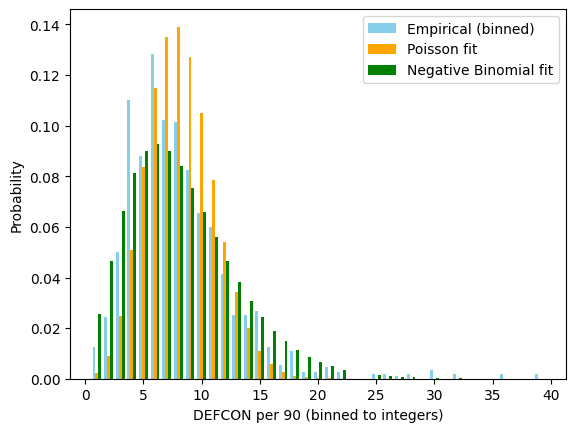

Mean: 8.233, Variance: 22.630
Overdispersion ratio (Var/Mean): 2.749
⚠️ Likely overdispersed → Negative Binomial may fit better.


In [ ]:
#Test if defcon_p90 is neg binom distributed

import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import poisson, nbinom
print("Mids & Forwards")

# Filter to reasonable samples
data = df[(df['minutes'] > 0)
          & (df['defensive_contribution_per90'] > 0) 
          & (df['defensive_contribution_per90'] < 40)
          & (df['position'].isin(['DEF']))]['defensive_contribution_per90']

# Estimate λ
lambda_hat = np.mean(data)
print(f"Estimated λ (mean defcon per 90): {lambda_hat:.3f}")

# --- BINNING into discrete Poisson-like counts ---
binned = np.round(data).astype(int)
binned = np.clip(binned, 0, None)

# Empirical frequencies
values, counts = np.unique(binned, return_counts=True)
prob_empirical = counts / counts.sum()

# --- Poisson PMF ---
poisson_pmf = poisson.pmf(values, mu=lambda_hat)

# --- Negative Binomial PMF (method of moments) ---
mean_val = np.mean(binned)
var_val = np.var(binned, ddof=1)

if var_val > mean_val:
    r = (mean_val ** 2) / (var_val - mean_val)
    p = r / (r + mean_val)
    negbin_pmf = nbinom.pmf(values, n=r, p=p)
else:
    negbin_pmf = np.zeros_like(values)
    print("Variance ≤ Mean → NB undefined, skipping NB plot.")

# --- Plot ---
plt.bar(values - 0.25, prob_empirical, width=0.25, label='Empirical (binned)', color='skyblue')
plt.bar(values, poisson_pmf, width=0.25, label='Poisson fit', color='orange')
plt.bar(values + 0.25, negbin_pmf, width=0.25, label='Negative Binomial fit', color='green')
plt.xlabel('DEFCON per 90 (binned to integers)')
plt.ylabel('Probability')
plt.legend()
plt.show()

# --- Dispersion diagnostics ---
overdispersion_ratio = var_val / mean_val
print(f"Mean: {mean_val:.3f}, Variance: {var_val:.3f}")
print(f"Overdispersion ratio (Var/Mean): {overdispersion_ratio:.3f}")

if overdispersion_ratio > 1.2:
    print("⚠️ Likely overdispersed → Negative Binomial may fit better.")
else:
    print("✅ Poisson assumption looks reasonable.")


GK saves per 90
Estimated λ (mean defcon per 90): 3.218


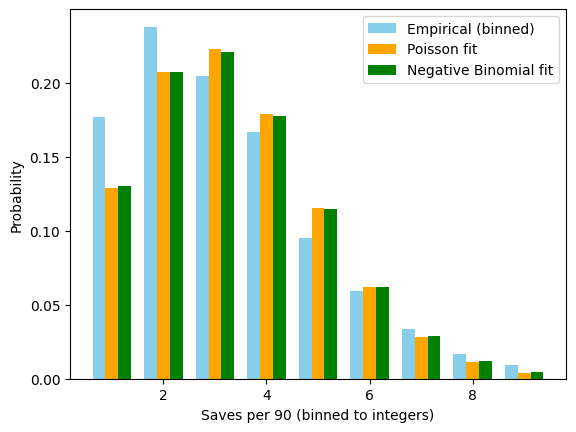

Mean: 3.218, Variance: 3.268
Overdispersion ratio (Var/Mean): 1.016
✅ Poisson assumption looks reasonable.


In [ ]:
#Test if saves_p90 is neg binom distributed

import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import poisson, nbinom
print("GK saves per 90")

# Filter to reasonable samples
data = df[#(df['minutes'] > 0)
          (df['saves_per90'] > 0) 
          & (df['saves_per90'] < 10)
          & (df['position'].isin(['GK']))]['saves_per90']

# Estimate λ
lambda_hat = np.mean(data)
print(f"Estimated λ (mean defcon per 90): {lambda_hat:.3f}")

# --- BINNING into discrete Poisson-like counts ---
binned = np.round(data).astype(int)
binned = np.clip(binned, 0, None)

# Empirical frequencies
values, counts = np.unique(binned, return_counts=True)
prob_empirical = counts / counts.sum()

# --- Poisson PMF ---
poisson_pmf = poisson.pmf(values, mu=lambda_hat)

# --- Negative Binomial PMF (method of moments) ---
mean_val = np.mean(binned)
var_val = np.var(binned, ddof=1)

if var_val > mean_val:
    r = (mean_val ** 2) / (var_val - mean_val)
    p = r / (r + mean_val)
    negbin_pmf = nbinom.pmf(values, n=r, p=p)
else:
    negbin_pmf = np.zeros_like(values)
    print("Variance ≤ Mean → NB undefined, skipping NB plot.")

# --- Plot ---
plt.bar(values - 0.25, prob_empirical, width=0.25, label='Empirical (binned)', color='skyblue')
plt.bar(values, poisson_pmf, width=0.25, label='Poisson fit', color='orange')
plt.bar(values + 0.25, negbin_pmf, width=0.25, label='Negative Binomial fit', color='green')
plt.xlabel('Saves per 90 (binned to integers)')
plt.ylabel('Probability')
plt.legend()
plt.show()

# --- Dispersion diagnostics ---
overdispersion_ratio = var_val / mean_val
print(f"Mean: {mean_val:.3f}, Variance: {var_val:.3f}")
print(f"Overdispersion ratio (Var/Mean): {overdispersion_ratio:.3f}")

if overdispersion_ratio > 1.2:
    print("⚠️ Likely overdispersed → Negative Binomial may fit better.")
else:
    print("✅ Poisson assumption looks reasonable.")


                                 OLS Regression Results                                
Dep. Variable:                  bonus   R-squared (uncentered):                   0.446
Model:                            OLS   Adj. R-squared (uncentered):              0.446
Method:                 Least Squares   F-statistic:                          3.194e+04
Date:                Mon, 24 Nov 2025   Prob (F-statistic):                        0.00
Time:                        10:43:21   Log-Likelihood:                         -37358.
No. Observations:               39625   AIC:                                  7.472e+04
Df Residuals:                   39624   BIC:                                  7.473e+04
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

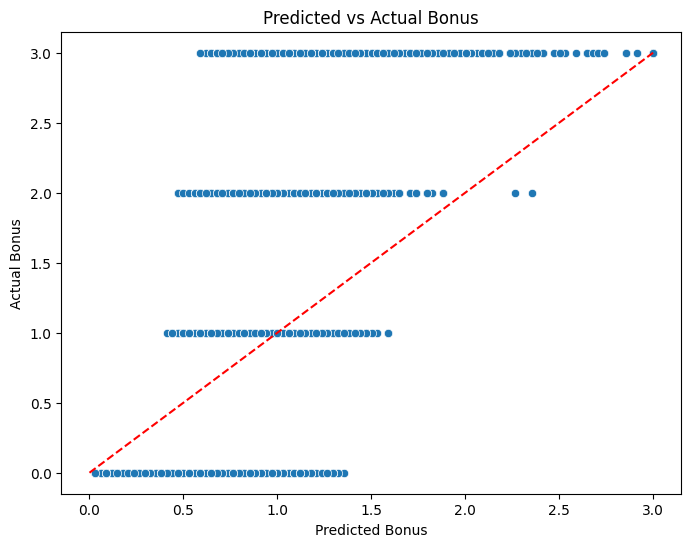

Actual Bonus       0.0       1.0       2.0       3.0
Position                                            
DEF           0.459322  0.232438  1.109286  1.952061
FWD           0.332252  0.200429  1.049983  1.711097
GK            0.492023  0.246861  1.117962  2.014093
GKP                NaN       NaN       NaN       NaN
MID           0.393939  0.247564  1.052744  1.828150


In [ ]:
# Generalize the relationship between bps & bonus points
import statsmodels.formula.api as smf
filtered = (df['minutes']>45) & (df['bonus']>=0) & (df['bps']>0) & (df['position'].isin(['GK','DEF','MID','FWD']))
# df['bonus_sq'] = df['bonus']**2

model = smf.ols('bonus ~ bps -1', data=df[filtered]).fit()
print(model.summary())

df['bonus_pred'] = model.predict(df[filtered])
df['bonus_pred'] = np.clip(df['bonus_pred'], 0, 3) # clip prediction to 3

import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8,6))
sns.scatterplot(x='bonus_pred', y='bonus', data=df)
plt.plot([df['bonus'].min(), df['bonus'].max()],
         [df['bonus'].min(), df['bonus'].max()],
         color='red', linestyle='--')  # 45-degree line
plt.xlabel('Predicted Bonus')
plt.ylabel('Actual Bonus')
plt.title('Predicted vs Actual Bonus')
plt.show()

import pandas as pd
import numpy as np

# Function to calculate RMSE
def rmse(actual, predicted):
    return np.sqrt(np.mean((actual - predicted) ** 2))

# Group by position and actual bonus, then calculate RMSE
rmse_table = df.groupby(['position', 'bonus']).apply(lambda x: rmse(x['bonus'], x['bonus_pred']))

# Convert to DataFrame
rmse_table = rmse_table.reset_index()
rmse_table.columns = ['Position', 'Actual Bonus', 'RMSE']

pivot_rmse = rmse_table.pivot(index='Position', columns='Actual Bonus', values='RMSE')
print(pivot_rmse)


In [ ]:
prediction_data = df[(df['season']==20252026)
                     &(df['event']>=stats_current_gameweek+1)]

In [ ]:
prediction_data.pivot_table(index='event',values='minutes',aggfunc='count')

,minutes
event,
13.0,0
14.0,0
15.0,0
16.0,0
17.0,0
18.0,0
19.0,0
20.0,0
21.0,0


In [ ]:
def predict_target_vectorized(df, model_dict, col_name):
    preds = []
    
    for pos, model in model_dict.items():
        subset = df[df['position'] == pos]
        if not subset.empty:
            pos_preds = model.predict_new(subset)
            temp = subset.copy()
            temp[col_name] = pos_preds
            preds.append(temp)
    
    if not preds:
        # If no positions matched at all
        return pd.Series(index=df.index, dtype=float)
    
    result = pd.concat(preds)
    
    # Safely align back to original DataFrame
    output = pd.Series(index=df.index, dtype=float)
    output.loc[result.index] = result[col_name]
    return output

In [ ]:
target_col_name = 'mins_pred'
mins_model_dict = {'FWD': FWD_mins_predictor, 'MID': MID_mins_predictor, 'DEF': DEF_mins_predictor, 'GK': GK_mins_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, mins_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_26352\2521843321.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, mins_model_dict, col_name=target_col_name)


count    11752.000000
mean        41.799293
std         29.296651
min          1.139041
25%         13.550880
50%         39.752838
75%         70.758524
max         88.225007
Name: mins_pred, dtype: float64

In [ ]:
target_col_name = 'xgp90_pred'
xg_model_dict = {'FWD': FWD_xG_predictor, 'MID': MID_xG_predictor, 'DEF': DEF_xG_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xg_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_26352\365369552.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xg_model_dict, col_name=target_col_name)


count    10998.000000
mean         0.141587
std          0.126664
min          0.002422
25%          0.052440
50%          0.094535
75%          0.187574
max          1.301504
Name: xgp90_pred, dtype: float64

In [ ]:
target_col_name = 'xap90_pred'
xA_model_dict = {'FWD': FWD_xA_predictor, 'MID': MID_xA_predictor, 'DEF': DEF_xA_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xA_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_26352\4144355699.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xA_model_dict, col_name=target_col_name)


count    10998.000000
mean         0.083137
std          0.050174
min          0.006931
25%          0.044324
50%          0.071862
75%          0.112587
max          0.275357
Name: xap90_pred, dtype: float64

In [ ]:
target_col_name = 'xgcp90_pred'
xGC_model_dict = {'FWD': FWD_xGC_predictor, 'MID': MID_xGC_predictor, 'DEF': DEF_xGC_predictor, 'GK':GK_xGC_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xGC_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_26352\682035545.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xGC_model_dict, col_name=target_col_name)


count    11752.000000
mean         1.437839
std          0.378311
min          0.398762
25%          1.180970
50%          1.378536
75%          1.677452
max          2.671198
Name: xgcp90_pred, dtype: float64

In [ ]:
target_col_name = 'xbpsp90_pred'
bps_model_dict = {'FWD': FWD_bps_predictor, 'MID': MID_bps_predictor, 'DEF': DEF_bps_predictor, 'GK':GK_bps_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, bps_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_26352\3051138591.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, bps_model_dict, col_name=target_col_name)


count    11752.000000
mean        15.304806
std          3.228971
min          4.999700
25%         13.125390
50%         15.156502
75%         17.162853
max         37.783233
Name: xbpsp90_pred, dtype: float64

In [ ]:
target_col_name = 'xsavesp90_pred'
saves_model_dict = {'GK':GK_saves_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, saves_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_26352\803536942.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, saves_model_dict, col_name=target_col_name)


count    754.000000
mean       2.870780
std        0.489071
min        1.437500
25%        2.547911
50%        2.947076
75%        3.157757
max        3.828891
Name: xsavesp90_pred, dtype: float64

In [ ]:
target_col_name = 'xdefconp90_pred'
defcon_model_dict = {'FWD': FWD_defcon_predictor, 'MID': MID_defcon_predictor, 'DEF': DEF_defcon_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, defcon_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_26352\2777375241.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, defcon_model_dict, col_name=target_col_name)


count    10998.000000
mean         7.535411
std          2.037260
min          2.588077
25%          6.374548
50%          7.656182
75%          8.910685
max         15.985289
Name: xdefconp90_pred, dtype: float64

In [ ]:
prediction_data[prediction_data['position']=='MID'].head()[["player_name_id","element","value","team_name","position","season","event","opp_team_name","opp_team_elo"
    ,'mins_pred','xgp90_pred','xap90_pred','xgcp90_pred'
    ]]

,player_name_id,element,value,team_name,position,season,event,opp_team_name,opp_team_elo,mins_pred,xgp90_pred,xap90_pred,xgcp90_pred
129659,Ben Winterburn,96.0,45.0,Bournemouth,MID,20252026.0,31.0,Man Utd,1056.034467,1.694040,0.195015,0.020334,1.423517
129751,Antoni Milambo,122.0,52.0,Brentford,MID,20252026.0,20.0,Everton,1053.833047,1.703192,0.163208,0.036253,0.840587
129828,Antoni Milambo,122.0,52.0,Brentford,MID,20252026.0,21.0,Sunderland,1030.901187,1.703192,0.161814,0.036136,0.866551
129881,Adam Wharton,273.0,50.0,Crystal Palace,MID,20252026.0,13.0,Man Utd,1056.034467,48.948620,0.082748,0.145963,1.341029
129883,Adam Wharton,273.0,50.0,Crystal Palace,MID,20252026.0,14.0,Burnley,895.747010,49.885852,0.103016,0.207574,0.833949


In [ ]:
prediction_data[
    (prediction_data['event']==picks_current_gameweek+1)
    &(prediction_data['mins_pred']>0)
    ][["player_name_id","element","value","team_name","position","season","event","opp_team_name","opp_team_elo"
    ,'mins_pred','xgp90_pred','xap90_pred','xgcp90_pred'
    ]].sort_values(by='xgp90_pred',ascending=False
        ).head(10)

,player_name_id,element,value,team_name,position,season,event,opp_team_name,opp_team_elo,mins_pred,xgp90_pred,xap90_pred,xgcp90_pred
134293,Erling Haaland,430.0,149.0,Man City,FWD,20252026.0,13.0,Leeds,918.161783,72.218537,1.277471,0.085345,1.241310
146053,Viktor Gyökeres,666.0,88.0,Arsenal,FWD,20252026.0,13.0,Chelsea,1144.719414,43.496534,0.597621,0.104889,1.170808
132231,Charalampos Kostoulas,181.0,48.0,Brighton,FWD,20252026.0,13.0,Nott'm Forest,1034.981739,8.932937,0.579829,0.057067,1.292445
134130,Enes Ünal,98.0,54.0,Bournemouth,FWD,20252026.0,13.0,Sunderland,1030.901187,14.058726,0.557772,0.204684,0.579101
136090,Igor Thiago Nascimento Rodrigues,136.0,64.0,Brentford,FWD,20252026.0,13.0,Burnley,895.747010,79.092123,0.536974,0.065079,1.227299
133769,Eddie Nketiah,284.0,54.0,Crystal Palace,FWD,20252026.0,13.0,Man Utd,1056.034467,17.806747,0.513467,0.083964,1.461616
133030,Danny Welbeck,178.0,65.0,Brighton,FWD,20252026.0,13.0,Nott'm Forest,1034.981739,79.680569,0.510566,0.051784,1.072317
130874,Arnaud Kalimuendo,696.0,60.0,Nott'm Forest,FWD,20252026.0,13.0,Brighton,1101.452851,3.656396,0.497695,0.078456,1.549560
146320,William Osula,500.0,55.0,Newcastle,FWD,20252026.0,13.0,Everton,1053.833047,16.016375,0.493582,0.055095,1.403288
145074,Stefanos Tzimas,180.0,53.0,Brighton,FWD,20252026.0,13.0,Nott'm Forest,1034.981739,9.323717,0.487527,0.078601,1.243942


In [ ]:
import pandas as pd
from scipy.stats import nbinom

def calculate_negbinom_parameters(position_list, df):

    # 1. Calculate mean and variance
    filtered = (df['minutes'] > 0) & (df['defensive_contribution_per90'] > 0) & (df['defensive_contribution_per90'] < 40) & (df['position'].isin(position_list))
    mean = df[filtered]['defensive_contribution_per90'].mean()
    variance = df[filtered]['defensive_contribution_per90'].var()
    # r = number of successes
    r = (mean**2) / (variance - mean)
    # p = success probability
    p = r / (r + mean)
    return r,p

In [ ]:
from scipy.stats import poisson
import numpy as np

def expected_score(mu, max_events=10, rule=None, points_per_n=None, points_value=None):
    """
    Calculate the expected score given an average event rate (mu)
    using a Poisson model.

    Parameters
    ----------
    mu : float
        Expected number of events (e.g., goals conceded, shots saved).
    max_events : int
        Maximum number of discrete events to sum over.
    rule : callable, optional
        Function that maps event count -> points. Example: lambda k: -np.floor(k / 2)
    points_per_n : int, optional
        For simple rules: number of events required for one point (e.g. 3 shots saved = 1 pt)
    points_value : float, optional
        Value of that one point (e.g. +1 for shots saved, -1 for goals conceded)

    Returns
    -------
    float
        Expected points based on Poisson-distributed event counts.
    """
    array = np.arange(0, max_events + 1)
    probs = poisson.pmf(array, mu)

    if rule is not None:
        scores = np.array([rule(k) for k in array])
    elif points_per_n is not None and points_value is not None:
        # General simple rule: 1 point_value for every n events
        scores = np.floor(array / points_per_n) * points_value
    else:
        raise ValueError("You must provide either a rule function or both points_per_n and points_value.")

    return np.sum(scores * probs)


In [ ]:
scoring_dict = {
    "FWD": {'xgp90_pred': 4, 'xap90_pred': 3, 'xgcp90_pred': 0, 'xgc_ss':0, 'defcon':2},
    "MID": {'xgp90_pred': 5, 'xap90_pred': 3, 'xgcp90_pred': 1, 'xgc_ss':0, 'defcon':2},
    "DEF": {'xgp90_pred': 6, 'xap90_pred': 3, 'xgcp90_pred': 4, 'xgc_ss':-1, 'defcon':2},
    "GK":  {'xgp90_pred': 10, 'xap90_pred': 3, 'xgcp90_pred': 4, 'xgc_ss':-1, 'defcon':2}
}

def scoring(x, scoring_dict, points_type, negbinom_rp_dict=None):
    mins_factor = x['mins_pred']/90
    if points_type == 'mins':
        if pd.isna(x['mins_pred']):
            return 0
        elif x['mins_pred'] >= 60:
            return 2
        elif x['mins_pred'] > 0:
            return 1
        else:
            return 0
    if points_type == 'goals':
        goals_points = mins_factor * x['xgp90_pred'] * scoring_dict[x['position']]['xgp90_pred']
        return goals_points
    if points_type == 'assists':
        assist_points = mins_factor * x['xap90_pred'] * scoring_dict[x['position']]['xap90_pred']
        return assist_points
    if points_type == 'clean_sheets':
        p_less_than_1 = poisson.cdf(0, mu=x['xgcp90_pred'])
        cs_points = p_less_than_1 * scoring_dict[x['position']]['xgcp90_pred']
        return cs_points
    
    if points_type == 'shots_saved': 
        if x['position'] == 'GK':
            saves_points = expected_score(mu=x['xsavesp90_pred'],  # expected shots saved per 90
                                   max_events=15,
                                   points_per_n=3, #for every 3 shots saved
                                   points_value=1) #scores 1 point
            return saves_points
        else:
            return 0
        
    if points_type == 'goals_conceded':
        if x['position'] in ['DEF','GK']:
            gc_points = expected_score(mu=x['xgcp90_pred'], 
                                   max_events=10, 
                                   points_per_n=2, #for every 2 goals conceded 
                                   points_value=-1) #scores -1 points 
            return gc_points
        else:
            return 0

    if points_type == 'defcon':
        pos = x['position']
        if pos in ['MID','FWD']:
            r = negbinom_rp_dict[pos]['r']
            p = negbinom_rp_dict[pos]['p']
            k = 12
            prob_more_than_12 = 1 - nbinom.cdf(k, r, p)
            defcon_points = prob_more_than_12 * scoring_dict[pos]['defcon']
            return defcon_points
        elif pos == 'DEF':
            r = negbinom_rp_dict[pos]['r']
            p = negbinom_rp_dict[pos]['p']
            k = 10
            prob_more_than_12 = 1 - nbinom.cdf(k, r, p)
            defcon_points = prob_more_than_12 * scoring_dict[pos]['defcon']
            return defcon_points
        else: return 0

    if points_type == 'bonus':
        return x['xbpsp90_pred']*0.0294 # ols regression coefficient

prediction_data['xpoints_mins'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='mins'), axis=1)
prediction_data['xpoints_goals'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='goals'), axis=1)
prediction_data['xpoints_assists'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='assists'), axis=1)
prediction_data['xpoints_clean_sheets'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='clean_sheets'), axis=1)

prediction_data['xpoints_shots_saved'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='shots_saved'), axis=1)
prediction_data['xpoints_goals_conceded'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='goals_conceded'), axis=1)

def_r,def_p = calculate_negbinom_parameters(['DEF'], df)
mid_r,mid_p = calculate_negbinom_parameters(['MID'], df)
fwd_r,fwd_p = calculate_negbinom_parameters(['FWD'], df)
rp_dict = {'DEF':{'r':def_r,'p':def_p},'MID':{'r':mid_r,'p':mid_p},'FWD':{'r':fwd_r,'p':fwd_p}}
prediction_data['xpoints_defcon'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='defcon', negbinom_rp_dict=rp_dict), axis=1)
prediction_data['xpoints_bonus'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='bonus'), axis=1)

prediction_data['xpoints'] = prediction_data[['xpoints_mins', 'xpoints_goals', 'xpoints_assists', 'xpoints_clean_sheets',
                                              'xpoints_shots_saved','xpoints_goals_conceded','xpoints_defcon','xpoints_bonus']].sum(axis=1, skipna=True)

C:\Users\chris\AppData\Local\Temp\ipykernel_26352\282654768.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data['xpoints_mins'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='mins'), axis=1)
C:\Users\chris\AppData\Local\Temp\ipykernel_26352\282654768.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data['xpoints_goals'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='goals'), axis=1)
C:\Users\chris\AppData\Local\Temp\ipykernel_

In [ ]:
predictions = prediction_data[['player_name_id', 'team_name','team_elo','element','position','opp_team_name','opp_team_elo', 'season', 'value', 'event',
                       'mins_pred', 'xgp90_pred', 'xap90_pred', 'xgcp90_pred',
                       'xpoints_mins', 'xpoints_goals', 'xpoints_assists', 'xpoints_clean_sheets','xpoints_shots_saved',
                       'xpoints_goals_conceded','xpoints_defcon','xpoints_bonus',
                       'xpoints']]
predictions

,player_name_id,team_name,team_elo,element,position,opp_team_name,opp_team_elo,season,value,event,...,xgcp90_pred,xpoints_mins,xpoints_goals,xpoints_assists,xpoints_clean_sheets,xpoints_shots_saved,xpoints_goals_conceded,xpoints_defcon,xpoints_bonus,xpoints
129659,Ben Winterburn,Bournemouth,1065.801289,96.0,MID,Man Utd,1056.034467,20252026.0,45.0,31.0,...,1.423517,1,0.018354,0.001148,0.240866,0.000000,0.000000,0.489885,0.441385,2.191637
129681,Aaron Hickey,Brentford,1057.381830,116.0,DEF,Burnley,895.747010,20252026.0,40.0,13.0,...,1.007771,1,0.122642,0.046533,1.460127,0.000000,-0.287198,0.548549,0.553925,3.444578
129682,Aaron Hickey,Brentford,1057.381830,116.0,DEF,Arsenal,1248.695856,20252026.0,40.0,14.0,...,2.037170,1,0.090681,0.032473,0.521589,0.000000,-0.772785,0.548549,0.273809,1.694317
129683,Aaron Hickey,Brentford,1057.381830,116.0,DEF,Spurs,1009.588903,20252026.0,40.0,15.0,...,1.178945,1,0.095771,0.045443,1.230413,0.000000,-0.363127,0.548549,0.427184,2.984233
129684,Aaron Hickey,Brentford,1057.381830,116.0,DEF,Leeds,918.161783,20252026.0,40.0,16.0,...,1.013699,1,0.113531,0.045787,1.451497,0.000000,-0.289769,0.548549,0.541149,3.410745
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146835,Đorđe Petrović,Bournemouth,1065.801289,67.0,GK,Leeds,918.161783,20252026.0,45.0,34.0,...,1.074460,2,NaN,NaN,1.365929,0.832193,-0.316382,0.000000,0.407613,4.289353
146836,Đorđe Petrović,Bournemouth,1065.801289,67.0,GK,Crystal Palace,1105.961120,20252026.0,45.0,35.0,...,1.614707,2,NaN,NaN,0.795796,0.761596,-0.567243,0.000000,0.380024,3.370173
146837,Đorđe Petrović,Bournemouth,1065.801289,67.0,GK,Fulham,1026.892057,20252026.0,45.0,36.0,...,1.259179,2,NaN,NaN,1.135548,0.774975,-0.399737,0.000000,0.379567,3.890353
146838,Đorđe Petrović,Bournemouth,1065.801289,67.0,GK,Man City,1215.899334,20252026.0,45.0,37.0,...,1.709293,2,NaN,NaN,0.723975,0.783404,-0.612826,0.000000,0.385299,3.279853


In [ ]:
prediction_data[
    (prediction_data['event']==picks_current_gameweek+1)
    &(prediction_data['mins_pred']>60)
    #&(prediction_data['position'].isin(['MID','FWD']))
    ][["player_name_id","element","value","team_name","position","event","opp_team_name","opp_team_elo"
    ,'mins_pred','xgp90_pred','xap90_pred','xdefconp90_pred','xbpsp90_pred','xpoints'
    ]].sort_values(by='xpoints',ascending=False
        ).head(10)

,player_name_id,element,value,team_name,position,event,opp_team_name,opp_team_elo,mins_pred,xgp90_pred,xap90_pred,xdefconp90_pred,xbpsp90_pred,xpoints
134293,Erling Haaland,430.0,149.0,Man City,FWD,13.0,Leeds,918.161783,72.218537,1.277471,0.085345,3.719844,29.591571,7.429267
141826,Mohamed Salah,381.0,142.0,Liverpool,MID,13.0,West Ham,980.813094,82.002892,0.405544,0.233692,3.157607,19.464618,5.881678
142461,Nico O'Reilly,411.0,50.0,Man City,DEF,13.0,Leeds,918.161783,77.532801,0.061051,0.149596,6.047882,24.172377,5.824470
144566,Rúben dos Santos Gato Alves Dias,408.0,55.0,Man City,DEF,13.0,Leeds,918.161783,80.530499,0.110066,0.042804,7.268930,22.567122,5.820077
143498,Phil Foden,414.0,80.0,Man City,MID,13.0,Leeds,918.161783,80.997561,0.303389,0.206733,6.489682,22.372363,5.596567
138528,Joško Gvardiol,403.0,58.0,Man City,DEF,13.0,Leeds,918.161783,77.189119,0.045710,0.075917,5.782526,21.243396,5.587925
140913,Matheus Nunes,407.0,53.0,Man City,DEF,13.0,Leeds,918.161783,82.020317,0.051210,0.069070,7.195670,22.829669,5.532447
133722,Eberechi Eze,266.0,76.0,Arsenal,MID,13.0,Chelsea,1144.719414,76.904702,0.352427,0.165848,8.105508,19.328792,5.367542
132458,Cody Gakpo,384.0,75.0,Liverpool,MID,13.0,West Ham,980.813094,68.285038,0.381998,0.215079,5.063661,19.997079,5.361488
138768,Jérémy Doku,418.0,65.0,Man City,MID,13.0,Leeds,918.161783,66.858339,0.250889,0.219512,7.094330,24.430733,5.219402


In [ ]:
prediction_data[
    (prediction_data['event']==picks_current_gameweek+1)
    &(prediction_data['mins_pred']>60)
    &(prediction_data['position']=='GK')
    ][["player_name_id","element","value","team_name","position","event","opp_team_name","opp_team_elo"
    ,'mins_pred','xpoints_clean_sheets','xpoints_shots_saved','xpoints_goals_conceded','xpoints_bonus','xpoints'
    ]].sort_values(by='xpoints',ascending=False
        ).head(10)

,player_name_id,element,value,team_name,position,event,opp_team_name,opp_team_elo,mins_pred,xpoints_clean_sheets,xpoints_shots_saved,xpoints_goals_conceded,xpoints_bonus,xpoints
135155,Gianluigi Donnarumma,736.0,57.0,Man City,GK,13.0,Leeds,918.161783,82.745716,2.008317,0.337763,-0.157520,0.446780,4.635340
132031,Caoimhín Kelleher,101.0,45.0,Brentford,GK,13.0,Burnley,895.747010,86.637419,1.451225,0.470501,-0.289850,0.477074,4.108950
142287,Nick Pope,469.0,52.0,Newcastle,GK,13.0,Everton,1053.833047,65.092493,1.231395,0.727244,-0.362766,0.487224,4.083097
131396,Bernd Leno,314.0,50.0,Fulham,GK,13.0,Spurs,1009.588903,88.128238,1.317436,0.592164,-0.332423,0.502361,4.079539
133998,Emiliano Martínez Romero,32.0,50.0,Aston Villa,GK,13.0,Wolves,922.344220,85.744362,1.473407,0.421619,-0.283279,0.445512,4.057259
137944,Jordan Pickford,287.0,55.0,Everton,GK,13.0,Newcastle,1098.980975,61.021842,1.145481,0.722895,-0.395736,0.492024,3.964664
135306,Guglielmo Vicario,565.0,50.0,Spurs,GK,13.0,Fulham,1026.892057,84.926784,1.148213,0.664566,-0.394643,0.543780,3.961916
146794,Đorđe Petrović,67.0,45.0,Bournemouth,GK,13.0,Sunderland,1030.901187,84.479331,1.135548,0.774975,-0.399737,0.378013,3.888799
141252,Matz Sels,502.0,47.0,Nott'm Forest,GK,13.0,Brighton,1101.452851,85.112280,1.034312,0.703490,-0.442993,0.472202,3.767012
133175,Dean Henderson,253.0,50.0,Crystal Palace,GK,13.0,Man Utd,1056.034467,86.767798,1.015569,0.717503,-0.451537,0.464881,3.746416


In [ ]:
table_name = "predictions"
if __name__ == "__main__":
    db_creator.create_staging_table_then_insert_data(table_name, data=predictions)
    preds = db_creator.table_to_df(table_name=table_name)
    print(preds.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11752 entries, 0 to 11751
Data columns (total 23 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   player_name_id          11752 non-null  object 
 1   team_name               11752 non-null  object 
 2   team_elo                11752 non-null  float64
 3   element                 11752 non-null  float64
 4   position                11752 non-null  object 
 5   opp_team_name           11752 non-null  object 
 6   opp_team_elo            11752 non-null  float64
 7   season                  11752 non-null  float64
 8   value                   11752 non-null  float64
 9   event                   11752 non-null  float64
 10  mins_pred               11752 non-null  float64
 11  xgp90_pred              10998 non-null  float64
 12  xap90_pred              10998 non-null  float64
 13  xgcp90_pred             11752 non-null  float64
 14  xpoints_mins            11752 non-null

In [ ]:
# Add new columns to the xPoints table
db_creator.execute_sql("""
    ALTER TABLE predictions
    ADD COLUMN IF NOT EXISTS in_any_team INTEGER DEFAULT 0,
    ADD COLUMN IF NOT EXISTS in_my_team INTEGER DEFAULT 0
""")

In [ ]:
current_gameweek = picks_current_gameweek
my_name = "Christopher Harris"

# Get the player lists
view = db_creator.run_sql(f"""
    WITH 
    current_players AS (
        SELECT element
        FROM fpl_picks
        WHERE gw = {current_gameweek}
    ),
    my_players AS (
        SELECT element
        FROM fpl_picks
        WHERE gw = {current_gameweek}
        AND member = '{my_name}'
    )
    SELECT * FROM my_players
""")

# Update the flags
db_creator.execute_sql(f"""
    UPDATE predictions
    SET in_any_team = 1
    WHERE element IN (
        SELECT element 
        FROM fpl_picks 
        WHERE gw = {current_gameweek}
    )
""")

db_creator.execute_sql(f"""
    UPDATE predictions
    SET in_my_team = 1
    WHERE element IN (
        SELECT element 
        FROM fpl_picks 
        WHERE gw = {current_gameweek}
        AND member = '{my_name}'
    )
""")

In [ ]:
print(f"Gameweek {picks_current_gameweek+1} Predictions")
prediction_data[
    prediction_data['event']==picks_current_gameweek+1
][["player_name_id","element",'event',"value","team_name","position","opp_team_name","opp_team_elo"
   ,'mins_pred', 'xpoints_mins', 'xpoints_goals', 'xpoints_assists', 'xpoints_clean_sheets', 
   'xpoints_shots_saved','xpoints_goals_conceded','xpoints_defcon','xpoints_bonus',
   'xpoints'
   ]].sort_values(by='xpoints',ascending=False
    ).head(10)

Gameweek 13 Predictions


,player_name_id,element,event,value,team_name,position,opp_team_name,opp_team_elo,mins_pred,xpoints_mins,xpoints_goals,xpoints_assists,xpoints_clean_sheets,xpoints_shots_saved,xpoints_goals_conceded,xpoints_defcon,xpoints_bonus,xpoints
134293,Erling Haaland,430.0,13.0,149.0,Man City,FWD,Leeds,918.161783,72.218537,2,4.100316,0.205449,0.000000,0.0,0.000000,0.253510,0.869992,7.429267
141826,Mohamed Salah,381.0,13.0,142.0,Liverpool,MID,West Ham,980.813094,82.002892,2,1.847544,0.638782,0.333208,0.0,0.000000,0.489885,0.572260,5.881678
142461,Nico O'Reilly,411.0,13.0,50.0,Man City,DEF,Leeds,918.161783,77.532801,2,0.315562,0.386620,2.018671,0.0,-0.155600,0.548549,0.710668,5.824470
144566,Rúben dos Santos Gato Alves Dias,408.0,13.0,55.0,Man City,DEF,Leeds,918.161783,80.530499,2,0.590912,0.114900,2.051809,0.0,-0.149566,0.548549,0.663473,5.820077
143498,Phil Foden,414.0,13.0,80.0,Man City,MID,Leeds,918.161783,80.997561,2,1.365208,0.558162,0.525564,0.0,0.000000,0.489885,0.657747,5.596567
138528,Joško Gvardiol,403.0,13.0,58.0,Man City,DEF,Leeds,918.161783,77.189119,2,0.235220,0.195332,2.121652,0.0,-0.137384,0.548549,0.624556,5.587925
140913,Matheus Nunes,407.0,13.0,53.0,Man City,DEF,Leeds,918.161783,82.020317,2,0.280019,0.188839,2.002460,0.0,-0.158613,0.548549,0.671192,5.532447
133722,Eberechi Eze,266.0,13.0,76.0,Arsenal,MID,Chelsea,1144.719414,76.904702,2,1.505739,0.425151,0.378501,0.0,0.000000,0.489885,0.568266,5.367542
132458,Cody Gakpo,384.0,13.0,75.0,Liverpool,MID,West Ham,980.813094,68.285038,2,1.449151,0.489557,0.344982,0.0,0.000000,0.489885,0.587914,5.361488
138768,Jérémy Doku,418.0,13.0,65.0,Man City,MID,Leeds,918.161783,66.858339,2,0.931891,0.489207,0.590156,0.0,0.000000,0.489885,0.718264,5.219402


In [ ]:
current_gameweek=picks_current_gameweek
print(f"Next 5 GWs: GW{current_gameweek} - GW{current_gameweek+5}")
next_5_gws_filter = (prediction_data['event']>=current_gameweek)&(prediction_data['event']<=current_gameweek+5)
prediction_data[next_5_gws_filter].groupby('player_name_id')[['mins_pred', 'xpoints_mins', 'xpoints_goals', 
                                           'xpoints_assists', 'xpoints_clean_sheets', 'xpoints_shots_saved','xpoints_goals_conceded','xpoints_defcon','xpoints_bonus',
                                           'xpoints'
                                           ]].agg('sum').reset_index().sort_values(by='xpoints',ascending=False).head(10)

Next 5 GWs: GW12 - GW17


,player_name_id,mins_pred,xpoints_mins,xpoints_goals,xpoints_assists,xpoints_clean_sheets,xpoints_shots_saved,xpoints_goals_conceded,xpoints_defcon,xpoints_bonus,xpoints
120,Erling Haaland,370.332162,10,17.005214,0.898473,0.000000,0.0,0.000000,1.267550,3.822395,32.993632
318,Mohamed Salah,410.496717,10,8.999928,3.118077,1.653269,0.0,0.000000,2.449424,2.721108,28.941807
118,Enzo Fernández,400.991426,10,7.140169,2.999462,1.612846,0.0,0.000000,2.449424,3.285924,27.487826
361,Pedro Lomba Neto,389.938596,10,7.276590,2.851136,1.586767,0.0,0.000000,2.449424,3.070663,27.234581
142,Gabriel dos Santos Magalhães,334.812711,10,4.297700,1.308405,7.256199,0.0,-1.499019,2.742747,2.932578,27.038609
106,Eberechi Eze,379.971678,10,6.943137,2.346922,2.134039,0.0,0.000000,2.449424,3.070969,26.944491
57,Bukayo Saka,408.551321,10,6.419115,2.953822,2.028780,0.0,0.000000,2.449424,2.827697,26.678838
73,Cody Gakpo,340.887740,10,7.027474,2.363491,1.671598,0.0,0.000000,2.449424,2.850452,26.362439
363,Phil Foden,405.572624,10,5.991402,2.356899,1.999050,0.0,0.000000,2.449424,2.968124,25.764900
93,Declan Rice,415.609573,10,5.767176,2.496770,2.062682,0.0,0.000000,2.449424,2.918225,25.694277


In [ ]:
print("Rest of Season Predictions")
prediction_data.groupby('player_name_id')[['mins_pred', 'xpoints_mins', 'xpoints_goals', 
                                           'xpoints_assists', 'xpoints_clean_sheets', 
                                           'xpoints_shots_saved','xpoints_goals_conceded','xpoints_defcon','xpoints_bonus',
                                           'xpoints'
                                           ]].agg('sum').reset_index().sort_values(by='xpoints',ascending=False).head(10)

Rest of Season Predictions


,player_name_id,mins_pred,xpoints_mins,xpoints_goals,xpoints_assists,xpoints_clean_sheets,xpoints_shots_saved,xpoints_goals_conceded,xpoints_defcon,xpoints_bonus,xpoints
120,Erling Haaland,1916.907727,52,78.984611,4.611914,0.000000,0.0,0.000000,6.591260,19.153338,161.341122
318,Mohamed Salah,2133.854083,52,45.813983,15.535030,7.997821,0.0,0.000000,12.737006,13.587446,147.671285
118,Enzo Fernández,2086.015847,52,37.233379,15.658450,8.334925,0.0,0.000000,12.737006,16.845317,142.809077
361,Pedro Lomba Neto,2031.321355,52,38.110346,15.013851,8.113190,0.0,0.000000,12.737006,15.756511,141.730904
142,Gabriel dos Santos Magalhães,1740.934314,52,22.433037,6.948375,38.312611,0.0,-7.665124,14.262284,15.245872,141.537055
106,Eberechi Eze,1974.785680,52,35.756792,12.276580,11.165882,0.0,0.000000,12.737006,16.601542,140.537802
57,Bukayo Saka,2125.223571,52,33.310104,15.383875,10.679639,0.0,0.000000,12.737006,15.424011,139.534635
73,Cody Gakpo,1772.969222,52,35.710245,11.745866,8.141095,0.0,0.000000,12.737006,14.194513,134.528726
93,Declan Rice,2162.801297,52,29.839336,13.034347,10.784750,0.0,0.000000,12.737006,15.532849,133.928287
257,Leandro Trossard,1996.773626,52,30.090756,11.548016,10.751924,0.0,0.000000,12.737006,15.518563,132.646264


In [ ]:
finish=time.perf_counter()
print(f'Finished in {round(((finish-start)/60),2)} minute(s)')
#10/11/25: Finished in 23.4 minute(s)

Finished in 7.57 minute(s)
